In [1]:
## Imports
import numpy as np
import matplotlib.pyplot as plt

from scipy.integrate import quad
from scipy.optimize import minimize
import control as ctrl
from scipy.linalg import solve
from scipy.signal import place_poles
from scipy import stats
import pandas as pd

import seaborn as sns
from scipy.signal import cont2discrete
from matplotlib.ticker import FuncFormatter

import warnings

# Suppress specific warning categories, in this case, FutureWarning
warnings.filterwarnings('ignore', category=FutureWarning)


/Users/aureliensoenen/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## 1.1 Open-loop System

In [2]:
# Parameters from Balboa
mp = 0.316  # body part mass [kg]
mw = 2 * 0.021  # wheel(*2) mass [kg]
l = 23.0 * 1e-3  # position of COM [m]

Ip = 444.43 * 1e-6  # inertia of body part [kg*m^2]
Iw = 2 * 26.89 * 1e-6  # inertia of wheel [kg*m^2]

r = 40 * 10 ** (-3)  # radius of wheel [m]
g = 9.81  # gravity [m/s^2]

# Weighting matrices
E = np.array([
    [Iw + (mw + mp) * r**2, mp * r * l],
    [mp * r * l, Ip + mp * l**2]
])  # for d^2/dt^2 (phi and theta)

F = np.array([
    [0],
    [-mp * g * l]
])  # for theta
G = np.array([
    [1],
    [0]
])  # for input torque

# State-space representation of the system
# State variable: phi, theta, d(phi)/dt, d(theta)/dt
A = np.vstack([
    np.hstack([np.zeros((2, 2)), np.eye(2)]),
    np.hstack([np.zeros((2, 1)), -solve(E, F), np.zeros((2, 2))])
])  # System matrix
B = np.vstack([
    np.zeros((2, 1)),
    solve(E, G)
])  # Input matrix
C = np.array([
    [1, 0, 0, 0]
])  # Output matrix

D = np.array([[0]])

C = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])  # Output matrix

D = np.array([[0],[0],[0],[0]])

sys1 = ctrl.ss(A, B, C, D)


In [3]:
colors = ['tab:orange', 'tab:blue', 'tab:green']
colors = ['#ED7D31', '#5B9BD5', '#70AD47', '#F4B183', '#9CC3E5', '#A8D08D']
# Orange - Blue - Green
label = ['Bessel','ITAE','LQR']
# Formatter function to format y-axis labels as multiples of pi
def multiple_of_pi(x, pos):
    if x == 0:
        return "0"
    elif x == 1:
        return "$\\pi$"
    elif x == -1:
        return "$-\\pi$"
    else:
        return "${0}\\pi$".format(int(x))
def multiple_of_pi_float(x, pos):
    if x == 0:
        return "0"
    elif x == 1:
        return "$\\pi$"
    elif x == -1:
        return "$-\\pi$"
    else:
        return "${:.1f}\\pi$".format(x)

## 1.1.0 Motor param

0.08555508427628508 0.08580781651993931 0.3199175174504836 -0.3769397833711321
Slope: 0.09, intercept: 0.35


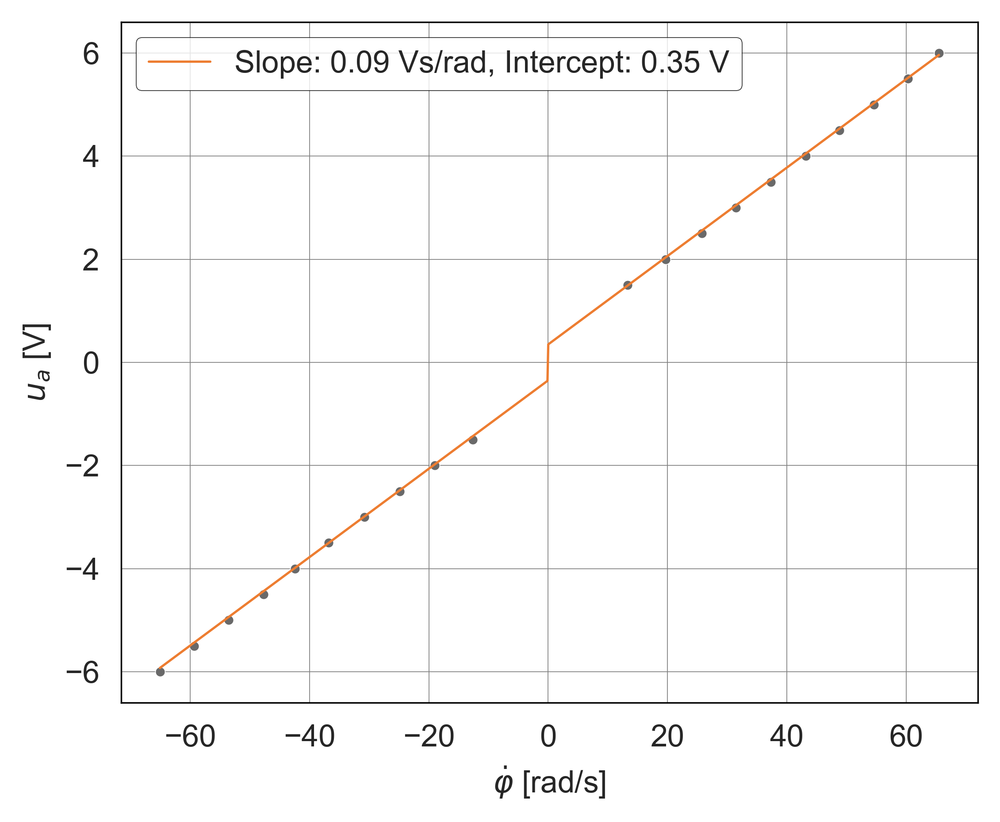

In [4]:
ua = np.concatenate((np.arange(1.5,6.5,0.5), np.arange(-1.5,-6.5,-0.5)), axis=None)

omega = np.array([13.31, 19.69, 25.80, 31.46, 37.33, 43.18, 48.82, 54.64, 60.30, 65.52, -12.61, -19.01, -24.86, -30.80, -36.79, -42.48, -47.74, -53.57, -59.39, -65.11, ])

slope1, intercept1, r_value, p_value, std_err = stats.linregress(omega[0:9], ua[0:9])
slope2, intercept2, r_value, p_value, std_err = stats.linregress(omega[10:18], ua[10:18])
print(slope1,slope2,intercept1,intercept2)
slope = (slope1+slope2)/2
intercept = (intercept1-intercept2)/2
print("Slope: {:.1g}, intercept: {:.2g}".format(slope, intercept))

x = np.linspace(min(omega), max(omega), 1000)


plt.figure(figsize=(5, 4), dpi=500)
sns.set_style("whitegrid")

sns.lineplot(x=x, y=x*slope+intercept*np.sign(x), color = colors[0], linestyle="-", linewidth=0.75)
sns.scatterplot(x=omega, y=ua, label='', color='dimgray', marker="o", s=10)


# Customizing axes and plot border
ax = plt.gca()  # Get current axis
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
    spine.set_color('black')  # Set spines color to black
    
# Customize legend
legend_text = f"Slope: {slope:.1g} Vs/rad, Intercept: {intercept:.2g} V"
legend = plt.legend([legend_text], frameon=True)
legend_frame = legend.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Setting the style for grid lines
plt.grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='grey')  # Minor grid
plt.minorticks_on()  # Turn on minor ticks

plt.xlabel("$\\dot{\\varphi}$ [rad/s]")
plt.ylabel("$u_a$ [V]")
#plt.title()
#plt.legend(loc = 'upper right')
# Save and show plot
plt.savefig("plot/motorParam.png", bbox_inches='tight')  
plt.show()


## 1.1.1 Printing matrices

In [5]:
a = 7.5
b = 0.09
c = 0.4
A_prime = A.copy()
B_prime = B/a
#A_prime[:,2] = A_prime[:,2]+B_prime.T*(-b)


In [6]:
print('\\\\\n'.join(' & '.join("{:.3g}".format(cell) for cell in row) for row in B_prime))

0\\
0\\
273\\
-130


In [7]:
Ts = 0.01
A_dt, B_dt, _,_,_ = cont2discrete((A_prime, B_prime, C, D), Ts, method='zoh')
print('\\\\\n'.join(' & '.join("{:.2g}".format(cell) for cell in row) for row in A_dt))


1 & -0.0035 & 0.01 & -1.2e-05\\
0 & 1 & 0 & 0.01\\
0 & -0.7 & 1 & -0.0035\\
0 & 1.5 & 0 & 1


## 1.2 Feedback gain: ITAE, Bessel, LQR

## 1.2.1 Eigenvalues

In [8]:
eig, vector = np.linalg.eig(A_dt)
print('{:.2g}, {:.2g}, {:.2g}, {:.2g}'.format(eig[0],eig[1],eig[2],eig[3]))


1, 1, 1.1, 0.88


In [9]:
n = A.shape[0]
controllability_mat = B
for i in range(1, n):
    controllability_mat = np.hstack((controllability_mat, np.linalg.matrix_power(A, i) @ B))
rank = np.linalg.matrix_rank(controllability_mat)
print(rank)

4


## 1.2.2 LQR
Notes 1.5: https://staff.uz.zgora.pl/wpaszke/materialy/kss/lqrnotes.pdf

In [10]:
K_LQR_opt = 0
costs = 2**np.arange(1,5,1)
for cost in costs:
    
    Q = [[1,0,0,0],                          
         [0,0,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    R = cost**2

    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
    if cost == 8:
        K_LQR_opt = K_LQR

    Kprint = K_LQR[0]
    #Kprint[2] = Kprint[2]-0.19
    print('\t{} & [ \\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] \\\\'.format(
        cost, Kprint[0], Kprint[1], Kprint[2], Kprint[3]
    ))

	2 & [ \begin{tblr}{cccc}-0.5 & -7.1 & -0.16 & -0.63\end{tblr}] \\
	4 & [ \begin{tblr}{cccc}-0.25 & -5.3 & -0.091 & -0.46\end{tblr}] \\
	8 & [ \begin{tblr}{cccc}-0.13 & -4.2 & -0.055 & -0.36\end{tblr}] \\
	16 & [ \begin{tblr}{cccc}-0.062 & -3.5 & -0.035 & -0.3\end{tblr}] \\


## 1.2.3 Pole position (Bessel + ITAE)

In [11]:
K_bessel_opt = 0
K_itae_opt = 0
for i in [0.8, 0.9, 1,1.1]:
    ts = i
    # Define the roots
    bessel = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j])/ts
    itae   = np.array([-4.236+12.617j, -4.236-12.617j, -6.254+4.139j, -6.254-4.139j])/ts

    # K for feedback
    K_bessel = ctrl.place(A_prime, B_prime, bessel)
    K_itae = ctrl.place(A_prime, B_prime, itae)
    
    if ts == 1:
        K_bessel_opt = K_bessel
        K_itae_opt = K_itae
    K_bessel = K_bessel[0]
    K_itae = K_itae[0]
    #Kprint[2] = Kprint[2]-0.19
    print('\t{} s & [\\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] & [\\begin{{tblr}}{{cccc}}{:.2g} & {:.2g} & {:.2g} & {:.2g}\\end{{tblr}}] \\\\'.format(
        ts, K_bessel[0], K_bessel[1], K_bessel[2], K_bessel[3], K_itae[0], K_itae[1], K_itae[2], K_itae[3]
    ))
    

	0.8 s & [\begin{tblr}{cccc}-0.11 & -3.4 & -0.045 & -0.28\end{tblr}] & [\begin{tblr}{cccc}-0.76 & -6.8 & -0.17 & -0.55\end{tblr}] \\
	0.9 s & [\begin{tblr}{cccc}-0.067 & -2.9 & -0.031 & -0.23\end{tblr}] & [\begin{tblr}{cccc}-0.48 & -5.4 & -0.12 & -0.42\end{tblr}] \\
	1 s & [\begin{tblr}{cccc}-0.044 & -2.5 & -0.023 & -0.2\end{tblr}] & [\begin{tblr}{cccc}-0.31 & -4.4 & -0.085 & -0.34\end{tblr}] \\
	1.1 s & [\begin{tblr}{cccc}-0.03 & -2.3 & -0.017 & -0.17\end{tblr}] & [\begin{tblr}{cccc}-0.21 & -3.8 & -0.064 & -0.28\end{tblr}] \\


## 1.3 Initial response: ITAE, Bessel, LQR

In [12]:
def calculate_stabilization_parameters(t, x, u, r):
    T1 = t[-1]  # Final time
    dt = t[1] - t[0]  # Time step

    # Mean absolute voltage
    ua_mean = np.mean(np.abs(u))

    # Mean wheel position error
    phi = x[:, 0]
    phi_error = np.mean(phi - r)

    # Standard deviation of wheel position
    phi_std = np.sqrt(np.mean((phi - r - phi_error)**2))

    # Standard deviation of angular position
    theta = x[:, 1]
    theta_std = np.sqrt(np.mean(theta**2))

    return ua_mean+c, abs(phi_error), phi_std, theta_std

In [15]:
def initialResponse(name,K):
    np.random.seed(10)
    Tmax = 1.25
    fs = 100  # Sampling frequency in Hz
    #t = np.linspace(0, Tmax, 1/fs)  # Time array
    
    
    samples = int(Tmax*fs)
    T = np.linspace(0, Tmax, samples)
    x = np.zeros((samples,4))
    u = np.zeros(samples)
    angle = 10/180*np.pi
    x[0] = [0, -angle, 0, 0.0]
    noise_factor=0.001
    for i in range(len(T)-1):
        u[i] = -K @ x[i]
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i]#+ noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[0] to be within [-π/2, π/2]
    u = u - x@[0,0,b,0]
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(T, x, u,np.zeros(len(T)))
    u = u+np.sign(u)*0.4
    print("\t{} & {:.2g} V & {:.2g} rad & {:.2g} rad & {:.2g} rad\\\\".format(name, ua_mean, phi_error, phi_std, theta_std))
    return T, x , u

	Bessel & 0.63 V & 0.59 rad & 0.53 rad & 0.06 rad\\
	ITAE & 0.62 V & 0.14 rad & 0.31 rad & 0.064 rad\\
	LQR & 0.58 V & 0.39 rad & 0.38 rad & 0.047 rad\\


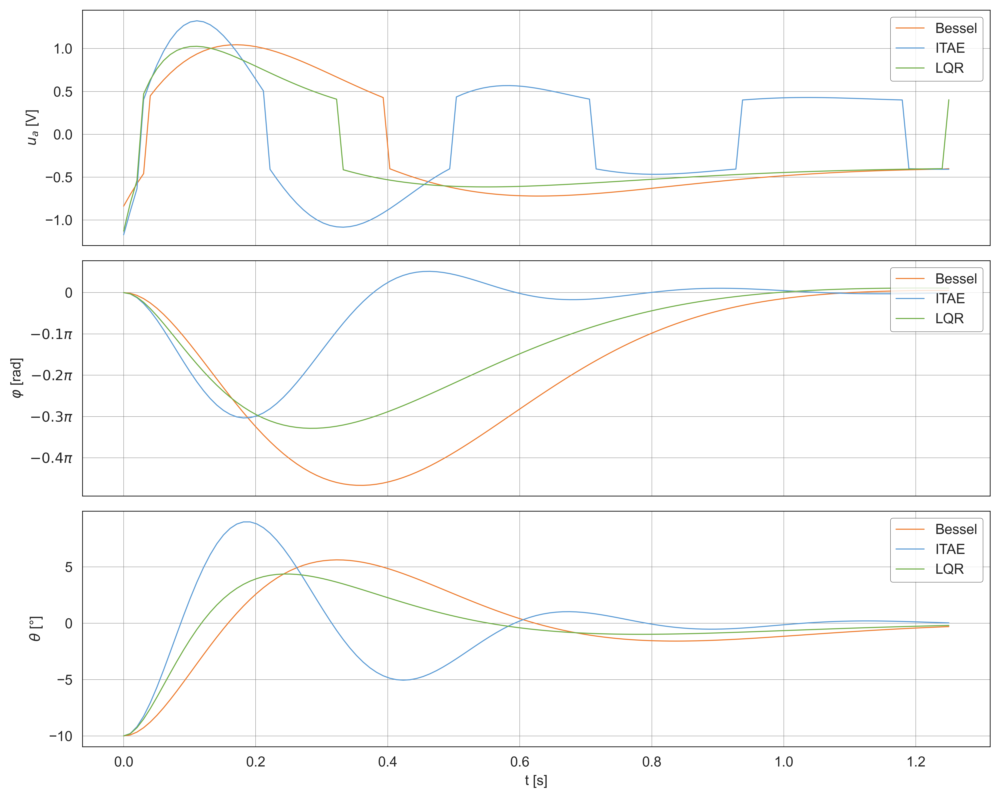

In [16]:
# Generate system responses
t, x_bessel, u_bessel = initialResponse('Bessel',K_bessel_opt)
t, x_itae, u_itae = initialResponse('ITAE', K_itae_opt)
t, x_LQR, u_LQR = initialResponse('LQR',K_LQR_opt)
# Create a new figure with 4 subplots

fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)

axs[0].plot(t, u_bessel, label=label[0], color=colors[0], linewidth=0.75)
axs[0].plot(t, u_itae, label=label[1], color=colors[1], linewidth=0.75)
axs[0].plot(t, u_LQR, label=label[2], color=colors[2], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot phi
axs[1].plot(t, x_bessel[:,0]/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[1].plot(t, x_itae[:,0]/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[1].plot(t, x_LQR[:,0]/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
# Set the y-axis formatter
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi_float))

# Plot theta
axs[2].plot(t, x_bessel[:,1]*180/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[2].plot(t, x_itae[:,1]*180/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[2].plot(t, x_LQR[:,1]*180/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

axs[2].set_xlabel('t [s]')


# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

plt.tight_layout()
plt.savefig("plot/InitialResponse.png", bbox_inches='tight') 


## 2 Reference tracking

In [17]:
def ref(Tmax,fs):
    t = np.arange(0, Tmax, 1/fs)  # Time array
    r = np.zeros_like(t)

    # Define segments
    rise_start, rise_end = 10, 15
    fall_start, fall_end = 25, 30

    # Calculate indices
    rise_indices = (t >= rise_start) & (t <= rise_end)
    fall_indices = (t >= fall_start) & (t <= fall_end)

    # Interpolate values for rise
    r[rise_indices] = np.linspace(0, 4*np.pi, rise_indices.sum())
    # Maintain the height of 4*pi between rise end and fall start
    r[(t > rise_end) & (t < fall_start)] = 4*np.pi
    # Interpolate values for fall
    r[fall_indices] = np.linspace(4*np.pi, 0, fall_indices.sum())

    return t, r
def ref2(Tmax,fs):
    t = np.arange(0, Tmax, 1/fs)  # Time array
    r = np.zeros_like(t)

    # Define segments
    rise_start, rise_end = 3, 5
    fall_start, fall_end = 10, 12

    # Calculate indices
    rise_indices = (t >= rise_start) & (t <= rise_end)
    fall_indices = (t >= fall_start) & (t <= fall_end)

    # Interpolate values for rise
    r[rise_indices] = np.linspace(0, 1, rise_indices.sum())
    # Maintain the height of 4*pi between rise end and fall start
    r[(t > rise_end) & (t < fall_start)] = 1
    # Interpolate values for fall
    r[fall_indices] = np.linspace(1, 0, fall_indices.sum())

    return t, r

In [18]:
def ProportionalRefTrack(name,K):
    np.random.seed(10)
    Tmax = 40
    fs = 100  # Sampling frequency in Hz
    t, r = ref(Tmax, fs)
    
    T = np.linspace(0, Tmax, Tmax*fs)
    x = np.zeros((Tmax*fs,4))
    u = np.zeros(Tmax*fs)
    x[0] = [0, 0.17, 0, 0.0]
    noise_factor=0.01
    for i in range(len(T)-1):
        u[i] = -K @ (x[i] - [r[i],0,0,0])
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i] + noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[0] to be within [-π/2, π/2]
    u = u - x@[0,0,b,0]
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(t, x, u, r)
    u = u+np.sign(u)*0.4
    print("\t{} & {:.2g} V & {:.2g} rad & {:.2g} rad & {:.2g} rad\\\\".format(name, ua_mean, phi_error, phi_std, theta_std))
    return t, x, u, r

	Bessel & 0.59 V & 0.0067 rad & 0.93 rad & 0.042 rad\\
	ITAE & 0.61 V & 0.0003 rad & 0.43 rad & 0.042 rad\\
	LQR & 0.56 V & 0.0031 rad & 0.73 rad & 0.033 rad\\


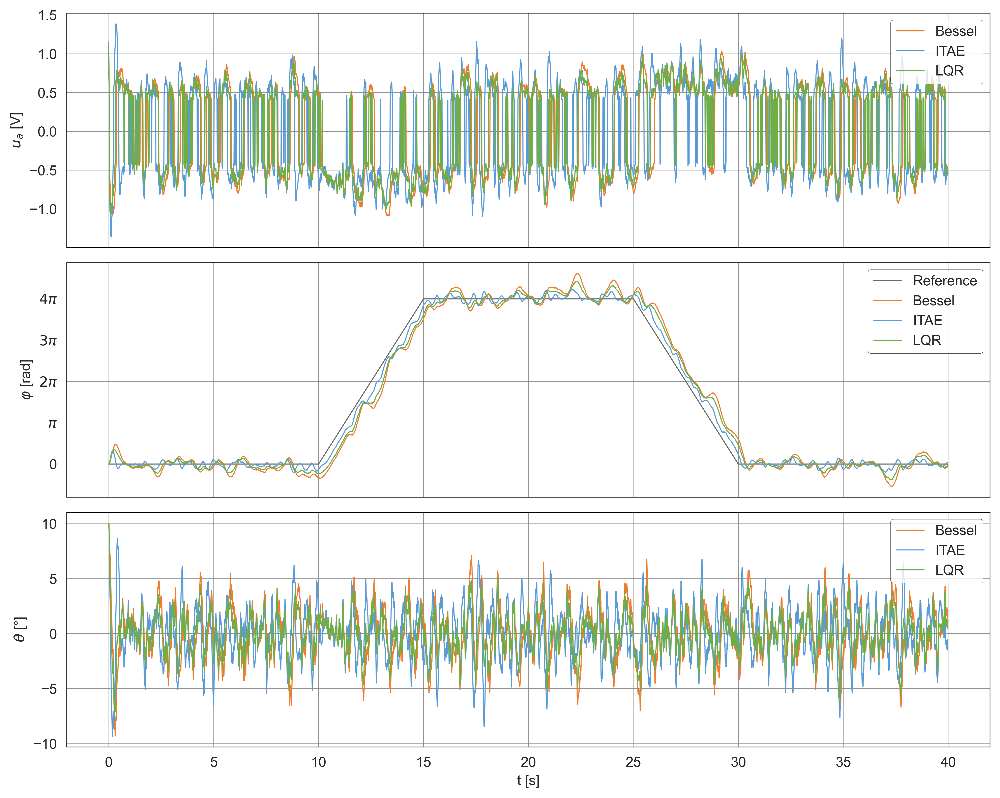

In [19]:
# Generate system responses
t, x_bessel, u_bessel, r = ProportionalRefTrack('Bessel',K_bessel_opt)
t, x_itae, u_itae, _ = ProportionalRefTrack('ITAE', K_itae_opt)
t, x_LQR, u_LQR,  _ = ProportionalRefTrack('LQR',K_LQR_opt)
# Create a new figure with 4 subplots

fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)

axs[0].plot(t, u_bessel, label=label[0], color=colors[0], linewidth=0.75)
axs[0].plot(t, u_itae, label=label[1], color=colors[1], linewidth=0.75)
axs[0].plot(t, u_LQR, label=label[2], color=colors[2], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot phi
axs[1].plot(t, r/np.pi, label='Reference', color='dimgray', linewidth=0.75)
axs[1].plot(t, x_bessel[:,0]/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[1].plot(t, x_itae[:,0]/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[1].plot(t, x_LQR[:,0]/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
# Set the y-axis formatter
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot theta
axs[2].plot(t, x_bessel[:,1]*180/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[2].plot(t, x_itae[:,1]*180/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[2].plot(t, x_LQR[:,1]*180/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

axs[2].set_xlabel('t [s]')


# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

plt.tight_layout()
plt.savefig("plot/propRefTrack.png", bbox_inches='tight')  


## 2.1 Noise analysis

In [20]:
# Define labels for the subplots
labels = ['$\overline{u}_{a}$ $[V]$', '$|\\epsilon_{\\varphi}|$ [°]', '$\\sigma_{\\varphi}$ [°]', '$\\sigma_{\\theta}$ [°]']
name = ['Bessel', 'ITAE', 'LQR']


In [21]:
def ParamRefTrack(K):
    np.random.seed(10)
    Tmax = 40
    fs = 100  # Sampling frequency in Hz
    t, r = ref(Tmax, fs)
    
    T = np.linspace(0, Tmax, Tmax*fs)
    x = np.zeros((Tmax*fs,4))
    u = np.zeros(Tmax*fs)
    x[0] = [0, 0.17, 0, 0.0]
    noise_factor=0.01
    for i in range(len(T)-1):
        u[i] = -K @ (x[i] - [r[i],0,0,0])
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i] + noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[0] to be within [-π/2, π/2]
    u = u - x@[0,0,b,0]
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(t, x, u, r)

    return np.array([ua_mean+c, phi_error*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi])

In [22]:
K_bessels = []
K_itaes = []
tsitae = np.linspace(0.6,1.9,50)
tsbessel = np.linspace(0.3,1.2,50)
for i in range(len(tsitae)):
    # Define the roots
    bessel = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j])/tsbessel[i]
    itae   = np.array([-4.236+12.617j, -4.236-12.617j, -6.254+4.139j, -6.254-4.139j])/tsitae[i]

    # K for feedback
    K_bessel = ctrl.place(A_prime, B_prime, bessel)
    K_itae = ctrl.place(A_prime, B_prime, itae)
    
    K_bessels.append(K_bessel[0])
    K_itaes.append(K_itae[0])

param_bessel = np.zeros((len(tsitae),4))
param_itae = np.zeros((len(tsitae),4))

for i in range(len(tsitae)):
    param_bessel[i] = ParamRefTrack(K_bessels[i])
    param_itae[i] = ParamRefTrack(K_itaes[i])

In [23]:
K_LQRs = []
costs = 2**np.arange(0,5,1)
#costs = np.linspace(2,200,50)
costs = np.linspace(0.25,15,50)
for cost in costs:
    
    Q = [[1,0,0,0],                          
         [0,0,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    R = cost**2
    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
    
    K_LQRs.append(K_LQR[0])

param_LQR = np.zeros((len(costs),4))

for i in range(len(costs)):
    param_LQR[i] = ParamRefTrack(K_LQRs[i])

In [24]:
def findBest(param,index1,index2,factor1,factor2):
    best = np.inf
    bestCoord = 0
    for i in range(len(param)):
        if np.sqrt((param[i,index1]/factor1)**2 + (param[i,index2]/factor2)**2) < best:
            best = np.sqrt((param[i,index1]/factor1)**2 + (param[i,index2]/factor2)**2)
            bestCoord = i
    return bestCoord

def findBestEpsilon(param,index1,index2,factor1,factor2):
    best = np.inf
    bestCoord = 0
    for i in range(len(param)):
        if param[i,index2] < 0:
            bestCoord = i
    return bestCoord

def plot_param(control,param, index, axs , color, label, linestyle = "-"):
    sns.lineplot(x=control, y=param[:,index], ax = axs, label=label, color=color, linestyle=linestyle, linewidth=0.75)
    sns.scatterplot(x=control, y=param[:,index], ax = axs, color='dimgray', marker="o", s=4)
    
def plot_segments(param, index1, index2, axs, color, label, linestyle = "-"):
    sns.scatterplot(x=param[:, index1], y=param[:, index2], ax = axs, color='dimgray', marker="o", s=4)
    for i in range(len(param) - 1):
        if i == 0:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], ax = axs, color=color, linestyle=linestyle, linewidth=0.75, label=label)
        else:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], ax = axs, color=color, linestyle=linestyle, linewidth=0.75)

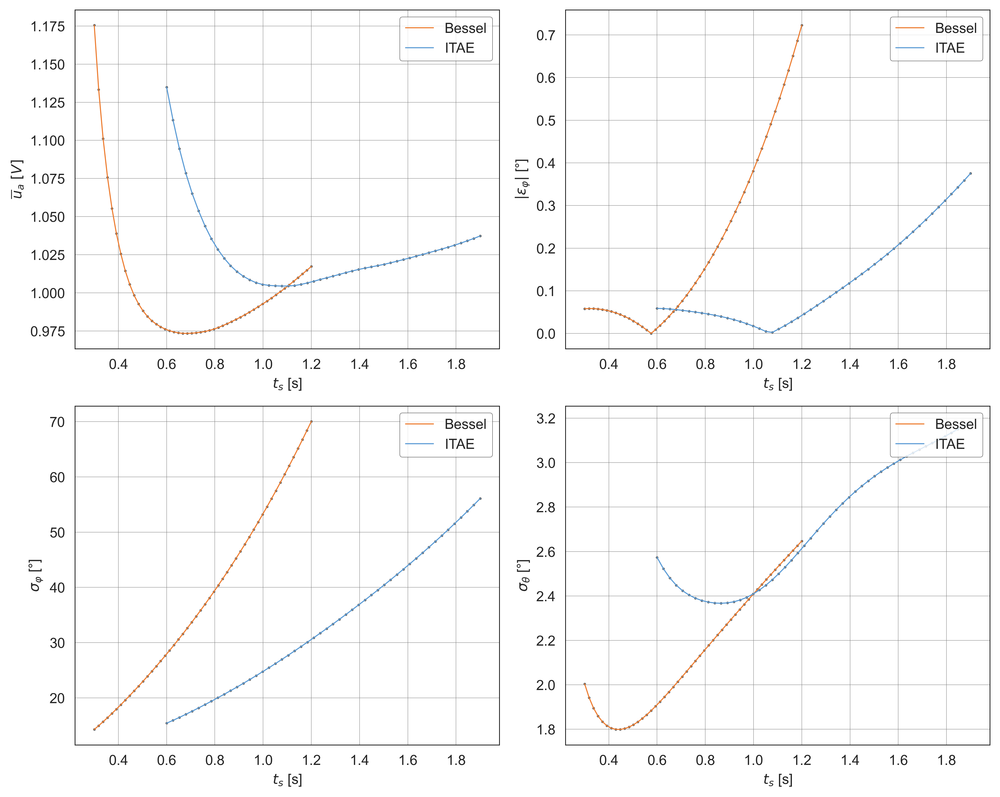

In [25]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")


# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(tsbessel,param_bessel, i, axs[row, col] , colors[0], name[0], linestyle = "-")
    plot_param(tsitae,param_itae, i, axs[row, col] , colors[1], name[1], linestyle = "-")
    
    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$t_{s}$ [s]")
    axs[row, col].set_ylabel(labels[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/propRefTrackts.png", bbox_inches='tight')  
plt.show()

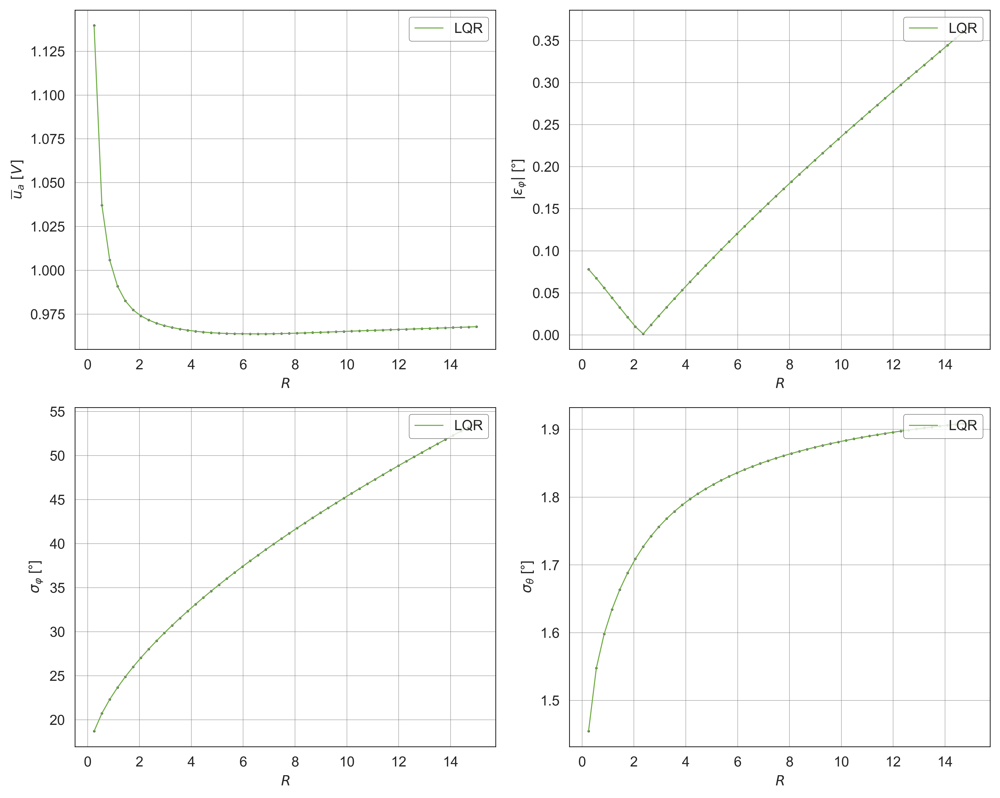

In [26]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Define labels for the subplots
name = ['Bessel', 'ITAE', 'LQR']

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    #sns.lineplot(x=ts, y=param_bessel[:,i], ax=axs[row, col], label=name[0], color='black', linestyle="-.", linewidth=0.75)
    #sns.lineplot(x=ts, y=param_itae[:,i], ax=axs[row, col], label=name[1], color='black', linestyle="--", linewidth=0.75)
    plot_param(costs,param_LQR, i, axs[row, col] , colors[2], name[2], linestyle = "-")

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$R$")
    axs[row, col].set_ylabel(labels[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/propRefTrackR.png", bbox_inches='tight')  
plt.show()

0.61 & 1.1 & 3 \\
0.61 & 1 & 3.3 \\
0.65 & 1 & 5.7 \\


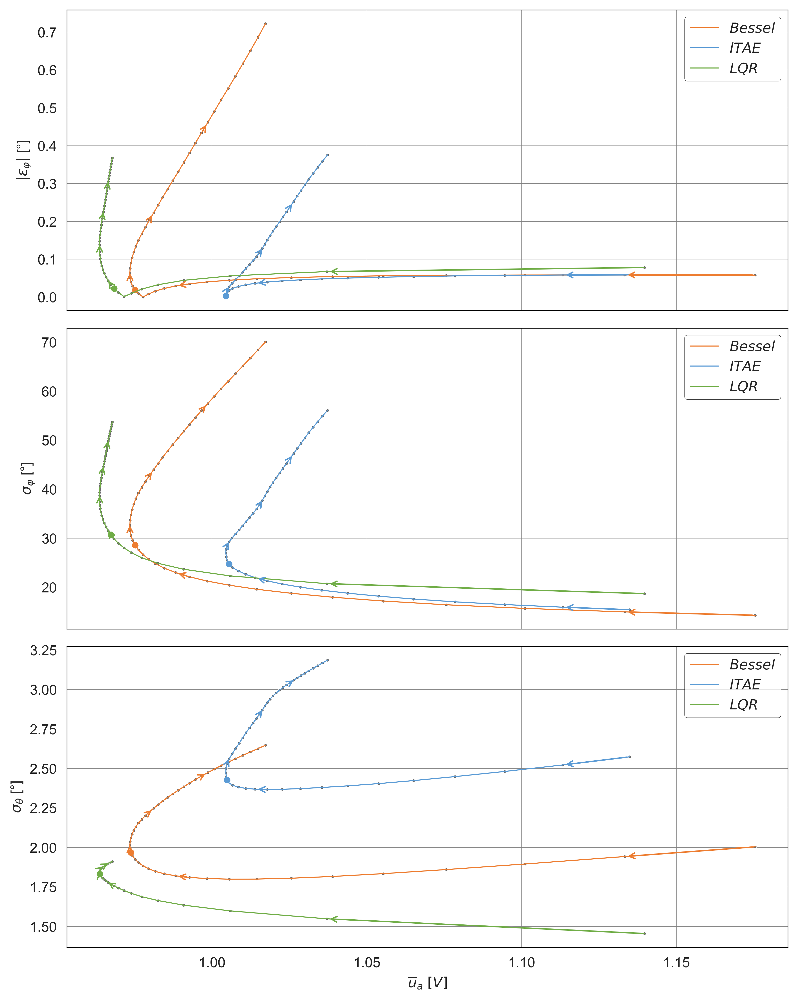

In [27]:
# Create a new figure with 4 subplots

fig, axs = plt.subplots(3, 1, figsize=(8, 10), sharex=True, dpi=500)
sSize = 25
# Plot 1
index1 = 0
index2 = 1
# Plotting segmented lines
plot_segments(param_bessel, index1, index2,axs[0] , colors[0], '$Bessel$')
plot_segments(param_itae, index1, index2,axs[0], colors[1], '$ITAE$')
plot_segments(param_LQR, index1, index2,axs[0], colors[2], '$LQR$')
    
factor1 = 0.7
factor2 = 0.3
bestBessel = findBest(param_bessel,index1,index2,factor1,factor2)
bestitae = findBest(param_itae,index1,index2,factor1,factor2)
bestLQR = findBest(param_LQR,index1,index2,factor1,factor2)
#bestBessel = 6
sns.scatterplot(x=[param_bessel[bestBessel,index1]], y=[param_bessel[bestBessel,index2]],ax = axs[0], marker="o", s=sSize, color=colors[0])
sns.scatterplot(x=[param_itae[bestitae,index1]], y=[param_itae[bestitae,index2]],ax = axs[0], marker="o", s=sSize, color=colors[1])
sns.scatterplot(x=[param_LQR[bestLQR,index1]], y=[param_LQR[bestLQR,index2]],ax = axs[0], marker="o", s=sSize, color=colors[2])
print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(tsbessel[bestBessel],tsitae[bestitae],costs[bestLQR] ))

axs[0].set_ylabel(labels[index2])
axs[0].legend()

# Add arrows to the plot
for i in range(1, len(param_bessel), len(param_bessel)//5):
    axs[0].annotate('', xy=(param_bessel[i, index1], param_bessel[i, index2]), xytext=(param_bessel[i-1, index1], param_bessel[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[0]))
for i in range(1, len(param_itae), len(param_itae)//5):
    axs[0].annotate('', xy=(param_itae[i, index1], param_itae[i, index2]), xytext=(param_itae[i-1, index1], param_itae[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[1]))
for i in range(1, len(param_LQR), len(param_LQR)//5):
    axs[0].annotate('', xy=(param_LQR[i, index1], param_LQR[i, index2]), xytext=(param_LQR[i-1, index1], param_LQR[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[2]))

# Plot 1
index1 = 0
index2 = 2
# Plotting segmented lines
plot_segments(param_bessel, index1, index2,axs[1] , colors[0], '$Bessel$')
plot_segments(param_itae, index1, index2,axs[1], colors[1], '$ITAE$')
plot_segments(param_LQR, index1, index2,axs[1], colors[2], '$LQR$')
    
factor1 = 0.3
factor2 = 50
bestBessel = findBest(param_bessel,index1,index2,factor1,factor2)
bestitae = findBest(param_itae,index1,index2,factor1,factor2)
bestLQR = findBest(param_LQR,index1,index2,factor1,factor2)
#bestBessel = 6
sns.scatterplot(x=[param_bessel[bestBessel,index1]], y=[param_bessel[bestBessel,index2]],ax = axs[1], marker="o", s=sSize, color=colors[0])
sns.scatterplot(x=[param_itae[bestitae,index1]], y=[param_itae[bestitae,index2]],ax = axs[1], marker="o", s=sSize, color=colors[1])
sns.scatterplot(x=[param_LQR[bestLQR,index1]], y=[param_LQR[bestLQR,index2]],ax = axs[1], marker="o", s=sSize, color=colors[2])
print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(tsbessel[bestBessel],tsitae[bestitae],costs[bestLQR] ))

axs[1].set_ylabel(labels[index2])
axs[1].legend()
# Add arrows to the plot
for i in range(1, len(param_bessel), len(param_bessel)//5):
    axs[1].annotate('', xy=(param_bessel[i, index1], param_bessel[i, index2]), xytext=(param_bessel[i-1, index1], param_bessel[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[0]))
for i in range(1, len(param_itae), len(param_itae)//5):
    axs[1].annotate('', xy=(param_itae[i, index1], param_itae[i, index2]), xytext=(param_itae[i-1, index1], param_itae[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[1]))
for i in range(1, len(param_LQR), len(param_LQR)//5):
    axs[1].annotate('', xy=(param_LQR[i, index1], param_LQR[i, index2]), xytext=(param_LQR[i-1, index1], param_LQR[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[2]))


# Plot 2
index1 = 0
index2 = 3
# Plotting segmented lines
plot_segments(param_bessel, index1, index2,axs[2] , colors[0], '$Bessel$')
plot_segments(param_itae, index1, index2,axs[2], colors[1], '$ITAE$')
plot_segments(param_LQR, index1, index2,axs[2], colors[2], '$LQR$')
    
factor1 = 0.3
factor2 = 3
bestBessel = findBest(param_bessel,index1,index2,factor1,factor2)
bestitae = findBest(param_itae,index1,index2,factor1,factor2)
bestLQR = findBest(param_LQR,index1,index2,factor1,factor2)
#bestBessel = 6
sns.scatterplot(x=[param_bessel[bestBessel,index1]], y=[param_bessel[bestBessel,index2]],ax = axs[2], marker="o", s=sSize, color=colors[0])
sns.scatterplot(x=[param_itae[bestitae,index1]], y=[param_itae[bestitae,index2]],ax = axs[2], marker="o", s=sSize, color=colors[1])
sns.scatterplot(x=[param_LQR[bestLQR,index1]], y=[param_LQR[bestLQR,index2]],ax = axs[2], marker="o", s=sSize, color=colors[2])
print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(tsbessel[bestBessel],tsitae[bestitae],costs[bestLQR] ))

axs[2].set_ylabel(labels[index2])
axs[2].legend()

axs[2].set_xlabel(labels[index1])
# Add arrows to the plot
for i in range(1, len(param_bessel), len(param_bessel)//5):
    axs[2].annotate('', xy=(param_bessel[i, index1], param_bessel[i, index2]), xytext=(param_bessel[i-1, index1], param_bessel[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[0]))
for i in range(1, len(param_itae), len(param_itae)//5):
    axs[2].annotate('', xy=(param_itae[i, index1], param_itae[i, index2]), xytext=(param_itae[i-1, index1], param_itae[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[1]))
for i in range(1, len(param_LQR), len(param_LQR)//5):
    axs[2].annotate('', xy=(param_LQR[i, index1], param_LQR[i, index2]), xytext=(param_LQR[i-1, index1], param_LQR[i-1, index2]), arrowprops=dict(arrowstyle="->", color=colors[2]))



# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

plt.tight_layout()
plt.savefig("plot/SimuOpti.png", bbox_inches='tight')  
plt.show()

## 2.2 Noise analysis

In [28]:
def NoiseRefTrack(K, noise_factor):
    np.random.seed(10)
    Tmax = 40
    fs = 100  # Sampling frequency in Hz
    t, r = ref(Tmax, fs)
    
    T = np.linspace(0, Tmax, Tmax*fs)
    x = np.zeros((Tmax*fs,4))
    u = np.zeros(Tmax*fs)
    x[0] = [0, 0.17, 0, 0.0]
    for i in range(len(T)-1):
        u[i] = -K @ (x[i] - [r[i],0,0,0])
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i] + noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[0] to be within [-π/2, π/2]
    u = u - x@[0,0,b,0]
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(t, x, u, r)

    return np.array([ua_mean+c, phi_error*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi])

In [29]:
tsitae = 1
tsbessel = 0.6
# Define the roots
bessel = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j])/tsbessel
itae   = np.array([-4.236+12.617j, -4.236-12.617j, -6.254+4.139j, -6.254-4.139j])/tsitae

# K for feedback
K_bessel = ctrl.place(A_prime, B_prime, bessel)[0]
K_itae = ctrl.place(A_prime, B_prime, itae)[0]
    
cost = 3
Q = [[1,0,0,0],                          
     [0,0,0,0],
     [0,0,0,0],
     [0,0,0,0]]
R = cost**2

K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
K_LQR = K_LQR[0]

In [30]:
noise = np.linspace(0.00,0.05,50)
param_bessel_noise = np.zeros((len(noise),4))
param_itae_noise = np.zeros((len(noise),4))
param_LQR_noise = np.zeros((len(noise),4))

for i in range(len(noise)):
    param_bessel_noise[i] = NoiseRefTrack(K_bessel, noise[i])
    param_itae_noise[i] = NoiseRefTrack(K_itae,noise[i])
    param_LQR_noise[i] = NoiseRefTrack(K_LQR,noise[i])


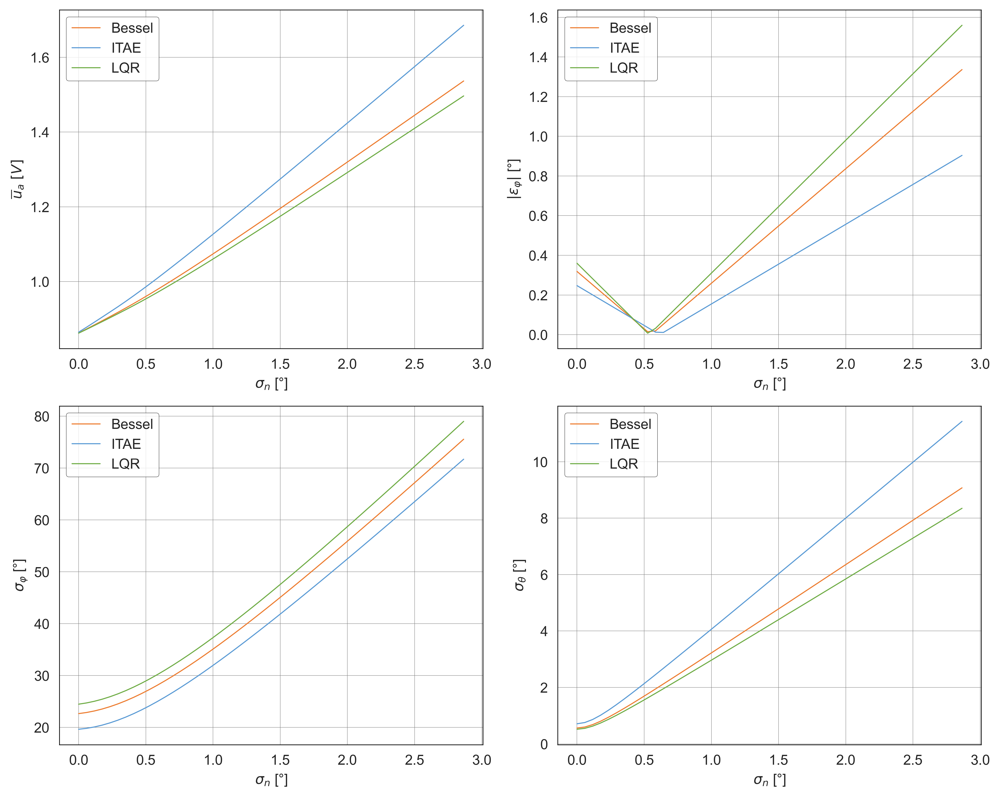

In [31]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Define labels for the subplots
name = ['Bessel', 'ITAE', 'LQR']

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    sns.lineplot(x=noise*180/np.pi, y=param_bessel_noise[:,i], ax=axs[row, col], label=name[0], color=colors[0], linestyle="-", linewidth=0.75)
    sns.lineplot(x=noise*180/np.pi, y=param_itae_noise[:,i], ax=axs[row, col], label=name[1], color=colors[1], linestyle="-", linewidth=0.75)
    sns.lineplot(x=noise*180/np.pi, y=param_LQR_noise[:,i], ax=axs[row, col], label=name[2], color=colors[2], linestyle="-", linewidth=0.75)

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$\\sigma_{n}$ [°]")
    axs[row, col].set_ylabel(labels[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/noiseAnalysesRefTrack.png", bbox_inches='tight')  
plt.show()

## Model-based Experimentation

In [32]:
def calculate_stabilization_parameters_experiment(t, phi, theta, u, r):
    # Mean absolute voltage
    ua_mean = np.mean(np.abs(u))

    # Mean wheel position error
    phi_error = np.mean(phi - r)

    # Standard deviation of wheel position
    phi_std = np.sqrt(np.mean((phi - r - phi_error)**2))

    # Standard deviation of angular position
    theta_std = np.sqrt(np.mean(theta**2))
    phi_error = np.abs(phi_error)

    return ua_mean, phi_error*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi

	Bessel & 0.82 V & 133.0\degree & 37\degree & 9.2\degree\\
	ITAE & 0.78 V & 28\degree & 48\degree & 4.8\degree\\
	LQR & 0.92 V & 37\degree & 77\degree & 6.5\degree\\


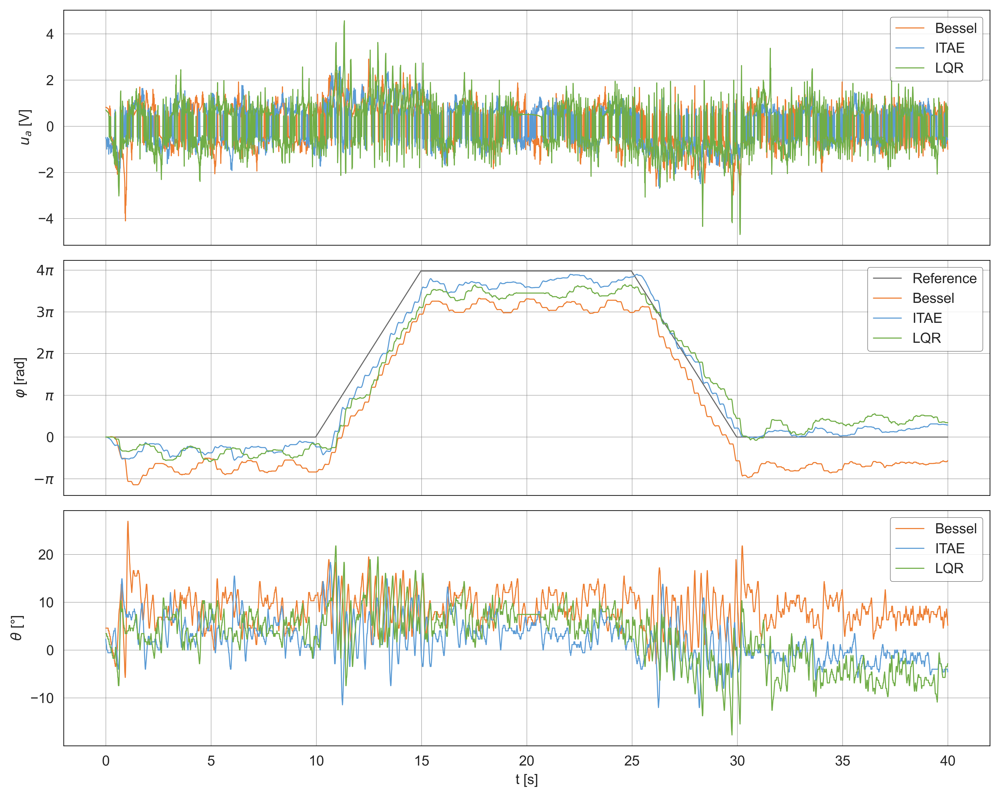

In [33]:
# Generate system responses
colnames=['time', 'phi', 'theta', 'phi_dot', 'theta_dot', 'ua', 'ref', 'ts'] 

df = pd.read_csv("data/BestBessel2.txt", names=colnames, header=1)
df.time -= df.time[0]
df = df[df.time<40000]
df.time /=1000
t, x_bessel, r, u_bessel = df.time, np.array([df.phi, df.theta, df.phi_dot,df.theta_dot]), df.ref, df.ua
ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)
print("\t{} & {:.2g} V & {:.1f}\\degree & {:.2g}\\degree & {:.2g}\\degree\\\\".format("Bessel", ua_mean, phi_error, phi_std, theta_std))


df = pd.read_csv("data/BestITAE.txt", names=colnames, header=1)
df.time -= df.time[0]
df = df[df.time<40000]
df.time /=1000
x_itae, u_itae = np.array([df.phi, df.theta, df.phi_dot,df.theta_dot]), df.ua
ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)
print("\t{} & {:.2g} V & {:.2g}\\degree & {:.2g}\\degree & {:.2g}\\degree\\\\".format("ITAE", ua_mean, phi_error, phi_std, theta_std))

df = pd.read_csv("data/BestLQR.txt", names=colnames, header=1)
df.time -= df.time[0]
df = df[df.time<40000]
df.time /=1000
x_LQR, u_LQR = np.array([df.phi, df.theta, df.phi_dot,df.theta_dot]), df.ua
ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)
print("\t{} & {:.2g} V & {:.2g}\\degree & {:.2g}\\degree & {:.2g}\\degree\\\\".format("LQR", ua_mean, phi_error, phi_std, theta_std))

# Create a new figure with 4 subplots

fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True, dpi=500)

axs[0].plot(t, u_bessel, label=label[0], color=colors[0], linewidth=0.75)
axs[0].plot(t, u_itae, label=label[1], color=colors[1], linewidth=0.75)
axs[0].plot(t, u_LQR, label=label[2], color=colors[2], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot phi
axs[1].plot(t, r/np.pi, label='Reference', color='dimgray', linewidth=0.75)
axs[1].plot(t, x_bessel[0]/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[1].plot(t, x_itae[0]/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[1].plot(t, x_LQR[0]/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
# Set the y-axis formatter
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot theta
axs[2].plot(t, x_bessel[1]*180/np.pi, label=label[0], color=colors[0], linewidth=0.75)
axs[2].plot(t, x_itae[1]*180/np.pi, label=label[1], color=colors[1], linewidth=0.75)
axs[2].plot(t, x_LQR[1]*180/np.pi, label=label[2], color=colors[2], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

axs[2].set_xlabel('t [s]')


# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper right')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

plt.tight_layout()
plt.savefig("plot/propRefTrack_exp.png", bbox_inches='tight')  


In [34]:
def ParamRefTrack_exp(K):
    np.random.seed(10)
    Tmax = 40
    fs = 100  # Sampling frequency in Hz
    t, r = ref(Tmax, fs)
    
    T = np.linspace(0, Tmax, Tmax*fs)
    x = np.zeros((Tmax*fs,4))
    u = np.zeros(Tmax*fs)
    x[0] = [0, 0.17, 0, 0.0]
    noise_factor=0.025
    for i in range(len(T)-1):
        u[i] = -K @ (x[i] - [r[i],0,0,0])
        u[i] = np.clip(u[i], -6, 6)  # Clip u to be within [-6, 6]
        noise = noise_factor * np.random.randn(4)
        x[i+1] = A_dt @ x[i] + B_dt.T[0] * u[i] + noise
        x[i+1][1] = np.clip(x[i+1][1], -np.pi/2, np.pi/2)  # Clip x[0] to be within [-π/2, π/2]
    b = 0.09
    u = u - x@[0,0,b,0]
    ua_mean, phi_error, phi_std, theta_std = calculate_stabilization_parameters(t, x, u, r)

    return np.array([ua_mean, phi_error*180/np.pi, phi_std*180/np.pi, theta_std*180/np.pi])

In [35]:
K_bessels = []
K_itaes = []
tsitae = np.linspace(0.5,1.75,25)
tsbessel = np.linspace(0.3,1.2,25)
for i in range(len(tsitae)):
    # Define the roots
    bessel = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j])/tsbessel[i]
    itae   = np.array([-4.236+12.617j, -4.236-12.617j, -6.254+4.139j, -6.254-4.139j])/tsitae[i]

    # K for feedback
    K_bessel = ctrl.place(A_prime, B_prime, bessel)
    K_itae = ctrl.place(A_prime, B_prime, itae)
    
    K_bessels.append(K_bessel[0])
    K_itaes.append(K_itae[0])

param_bessel = np.zeros((len(tsitae),4))
param_itae = np.zeros((len(tsitae),4))

for i in range(len(tsitae)):
    param_bessel[i] = ParamRefTrack_exp(K_bessels[i])
    param_itae[i] = ParamRefTrack_exp(K_itaes[i])

In [36]:
K_LQRs = []
costs = np.linspace(1,64,25)
#costs = np.linspace(1,14,50)
for cost in costs:
    
    Q = [[1,0,0,0],                          
         [0,0,0,0],
         [0,0,0,0],
         [0,0,0,0]]
    R = cost**2
    K_LQR, S, P = ctrl.lqr(A_prime, B_prime, Q, R)
    
    K_LQRs.append(K_LQR[0])

param_LQR = np.zeros((len(costs),4))

for i in range(len(costs)):
    param_LQR[i] = ParamRefTrack_exp(K_LQRs[i])

In [37]:
filesbessel = np.arange(0.4,1.2,0.1)
filesbessel = np.arange(0.4,1.1,0.1)
filesitae = np.arange(0.7,1.4,0.1)
fileslqr = 1*2**np.arange(0,7,1)
#fileslqr = [1,2,2.5,4,8,16,32,64]

param_bessel_exp = np.zeros((len(filesbessel),4))
param_itae_exp = np.zeros((len(filesitae),4))
param_LQR_exp = np.zeros((len(fileslqr),4))


for i in range(len(filesbessel)):
    df = pd.read_csv("data2/Bessel/{:.1f}.txt".format(filesbessel[i]), names=colnames, header=1)
    df.time -= df.time[0]
    df = df[df.time<40000]
    df.time /=1000
    param_bessel_exp[i] = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)

for i in range(len(filesitae)):
    df = pd.read_csv("data2/ITAE/{:.1f}.txt".format(filesitae[i]), names=colnames, header=1)
    df.time -= df.time[0]
    df = df[df.time<40000]
    df.time /=1000
    param_itae_exp[i] = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)
    
for i in range(len(fileslqr)):
    df = pd.read_csv("data/LQR/{:.1f}.txt".format(fileslqr[i]), names=colnames, header=1)
    df.time -= df.time[0]
    df = df[df.time<40000]
    df.time /=1000
    param_LQR_exp[i] = calculate_stabilization_parameters_experiment(df.time, df.phi,df.theta, df.ua, df.ref)
print(param_bessel_exp, param_itae_exp)

[[  2.59633124  16.79851868  56.42996319  11.86575516]
 [  1.15247428   6.77499229  52.58481186   5.90887536]
 [  0.91267503  72.36981744  61.14296987   6.81052818]
 [  0.80915684  82.94344084  68.85455893   5.43014166]
 [  0.77506901 155.77938856  97.87253441   6.47179732]
 [  0.75444918 214.2800329  119.17082933   6.63856169]
 [  0.74834379 402.36748351 171.33005065   8.60671343]] [[  1.30324216  89.91152781  29.627367    14.42002334]
 [  0.92384944  79.30469156  35.06568138  10.17039751]
 [  0.78281807  76.83658779  37.25777263   7.97668742]
 [  0.77979925  28.14380192  48.18552112   4.75725005]
 [  0.78404768  99.37589916  64.73256121   7.48514615]
 [  0.75553827  66.24470451  85.73344264   5.72033992]
 [  0.81085069 225.41539935 136.31548275  10.62006088]]


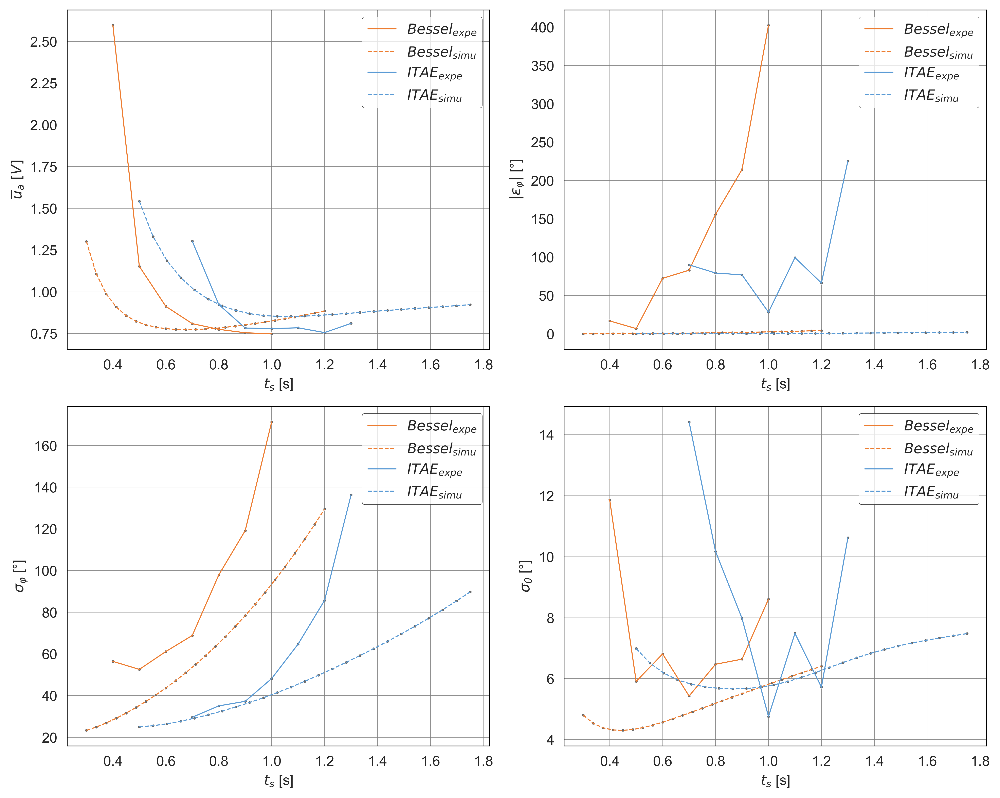

In [44]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")


# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(filesbessel,param_bessel_exp, i, axs[row, col] , colors[0], "${}_{{expe}}$".format(name[0]))
    plot_param(tsbessel,param_bessel, i, axs[row, col] , colors[0], "${}_{{simu}}$".format(name[0]), linestyle="--")
    plot_param(filesitae,param_itae_exp, i, axs[row, col] , colors[1], "${}_{{expe}}$".format(name[1]))
    plot_param(tsitae,param_itae, i, axs[row, col] , colors[1], "${}_{{simu}}$".format(name[1]), linestyle="--")
    
    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$t_s$ [s]")
    axs[row, col].set_ylabel(labels[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/expeWithNoise.png", bbox_inches='tight')  
plt.show()

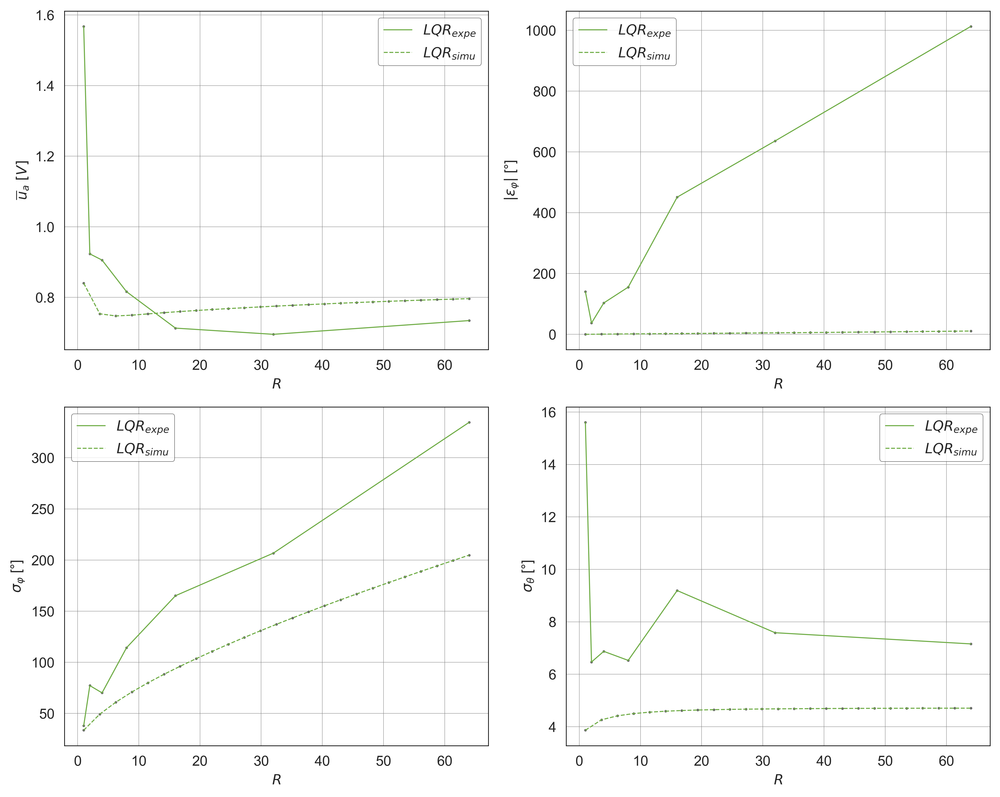

In [45]:
# Create a figure with 2x2 subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=500)
sns.set_style("whitegrid")

# Define labels for the subplots
name = ['Bessel', 'ITAE', 'LQR']

# Plot each parameter on a separate subplot
for i in range(4):
    row, col = divmod(i, 2)
    plot_param(fileslqr,param_LQR_exp, i, axs[row, col] , colors[2], "${}_{{expe}}$".format(name[2]))
    plot_param(costs,param_LQR, i, axs[row, col] , colors[2], "${}_{{simu}}$".format(name[2]), linestyle="--")

    # Customizing axes and plot border
    for spine in axs[row, col].spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')  # Set spines color to black
    
    # Customize legend
    legend = axs[row, col].legend(frameon=True)
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)      # Change the box's border width
    
    # Setting the style for grid lines
    axs[row, col].grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
    axs[row, col].minorticks_on()  # Turn on minor ticks

    axs[row, col].set_xlabel("$R$")
    axs[row, col].set_ylabel(labels[i])

# Adjust layout
plt.tight_layout()

# Save and show plot
plt.savefig("plot/protLQRparams.png", bbox_inches='tight')  
plt.show()

In [49]:

def plot_segments2(param, index1, index2, color, label, linestyle = "-"):
    sns.scatterplot(x=param[:, index1], y=param[:, index2], color='dimgray', marker="o", s=4)
    for i in range(len(param) - 1):
        if i == 0:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], color=color, linestyle=linestyle, linewidth=0.75, label=label)
        else:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], color=color, linestyle=linestyle, linewidth=0.75)
        
def plot_segments3(param, index1, index2, color, label, linestyle = "-"):
    for i in range(len(param) - 1):
        if i == 0:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], color=color, linestyle=linestyle, linewidth=0.75, label=label)
        else:
            sns.lineplot(x = [param[i, index1], param[i + 1, index1]], y = [param[i, index2], param[i + 1, index2]], color=color, linestyle=linestyle, linewidth=0.75)

0.7 & 0.9 & 4 \\


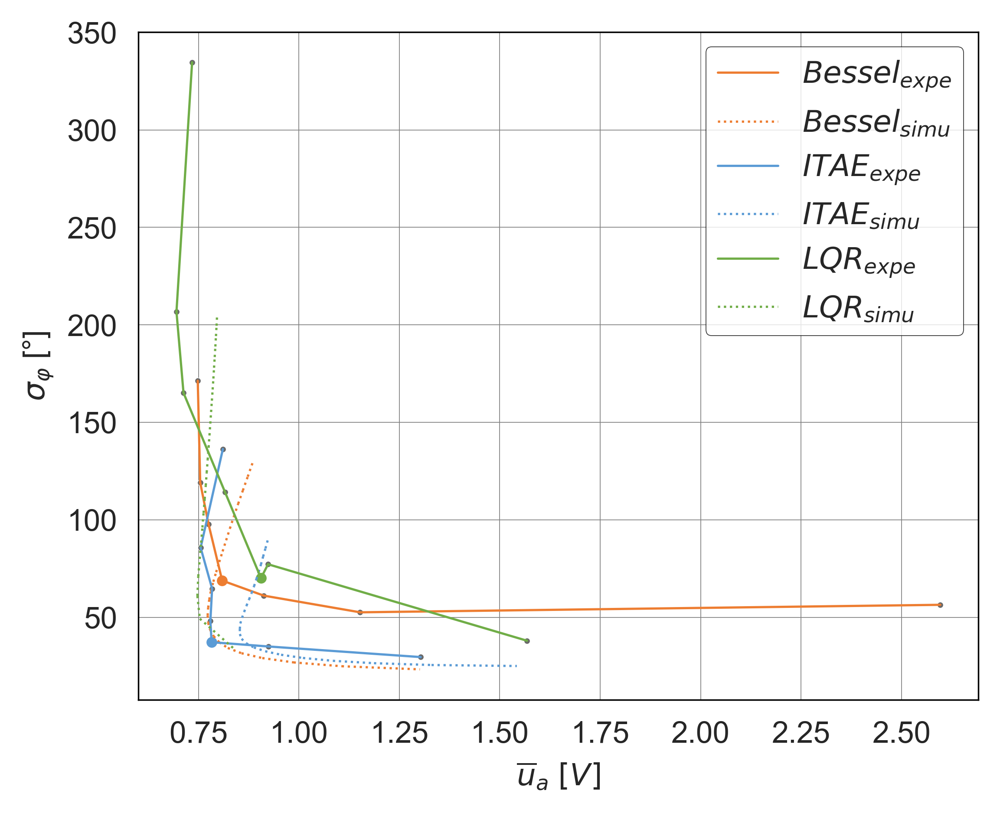

In [50]:
plt.figure(figsize=(5, 4), dpi=500)
sns.set_style("whitegrid")

index1 = 0
index2 = 2
plot_segments2(param_bessel_exp, index1, index2, colors[0], "${}_{{expe}}$".format(name[0]))
plot_segments3(param_bessel, index1, index2, colors[0], "${}_{{simu}}$".format(name[0]), linestyle = ":")
plot_segments2(param_itae_exp, index1, index2, colors[1], "${}_{{expe}}$".format(name[1]))
plot_segments3(param_itae, index1, index2, colors[1], "${}_{{simu}}$".format(name[1]), linestyle = ":")
plot_segments2(param_LQR_exp, index1, index2, colors[2], "${}_{{expe}}$".format(name[2]))
plot_segments3(param_LQR, index1, index2, colors[2], "${}_{{simu}}$".format(name[2]), linestyle = ":")


factor1 = 2.5
factor2 = 300
bestBessel_exp = findBest(param_bessel_exp,index1,index2,factor1,factor2)
bestitae_exp = findBest(param_itae_exp,index1,index2,factor1,factor2)
bestLQR_exp = findBest(param_LQR_exp,index1,index2,factor1,factor2)
#bestBessel = 6
sns.scatterplot(x=[param_bessel_exp[bestBessel_exp,index1]], y=[param_bessel_exp[bestBessel_exp,index2]], marker="o", s=15, color=colors[0])
sns.scatterplot(x=[param_itae_exp[bestitae_exp,index1]], y=[param_itae_exp[bestitae_exp,index2]], marker="o", s=15, color=colors[1])
sns.scatterplot(x=[param_LQR_exp[bestLQR_exp,index1]], y=[param_LQR_exp[bestLQR_exp,index2]], marker="o", s=15, color=colors[2])


print('{:.2g} & {:.2g} & {:.2g} \\\\'.format(filesbessel[bestBessel_exp],filesitae[bestitae_exp],fileslqr[bestLQR_exp]))



# Customizing axes and plot border
ax = plt.gca()  # Get current axis
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
    spine.set_color('black')  # Set spines color to black
    
# Customize legend
legend = plt.legend(frameon=True)
legend_frame = legend.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)      # Change the box's border width

# Setting the style for grid lines
plt.grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='grey')  # Minor grid
plt.minorticks_on()  # Turn on minor ticks

plt.xlabel(labels[index1])
plt.ylabel(labels[index2])

#plt.legend(loc = 'upper right')
# Save and show plot
plt.savefig("plot/ExpeControllerPerf1.png", bbox_inches='tight')  
plt.show()


## 2.5 Data-driven simulation

In [51]:
# Create a colormap that transitions from light to dark
from matplotlib.colors import LinearSegmentedColormap, Normalize
# Creating custom legend handles
import matplotlib.lines as mlines

def get_color_gradient(base_color, n):
    base_color = np.array(plt.get_cmap(base_color)(range(256)))
    color_map = LinearSegmentedColormap.from_list('custom_gradient', base_color)
    return [color_map(i) for i in np.linspace(0.3, 0.9, n)]  # 0.2 to 1 to start from a lighter color
colors2 = ['Oranges', 'Blues', 'Greens']
# Function to convert string to complex
def str_to_complex(s):
    # Check if the string contains 'i'
    if 'i' in str(s):
        return complex(s.replace('i', 'j'))
    else:
        # If no 'i', convert to float and then to complex
        return complex(float(s), 0)

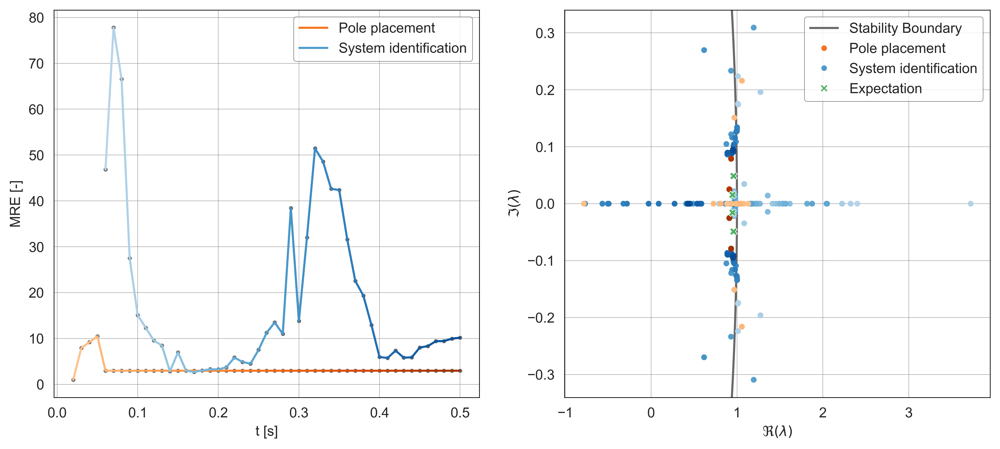

In [52]:
# Load data from CSV files
data1 = pd.read_csv('DDSimulation/DataForPlot/NoExcitementVariable1.csv')
data2 = pd.read_csv('DDSimulation/DataForPlot/NoExcitementVariable2.csv')

# Extract x and y values
x1 = data1['T_values']
y1 = data1['eig_diff1_values']

x2 = data2['T_values']
y2 = data2['eig_diff2_values']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)

gradient_colors = get_color_gradient(colors2[0], len(x1))
for j in range(len(x1)):
    ax1.plot(x1[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x1, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x2))
for j in range(len(x2)):
    ax1.plot(x2[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x2, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')
#ax1.legend()

# Load data from CSV files
data1 = pd.read_csv('DDSimulation/DataForPlot/NoExcitementVarPolePlot1.csv')
data2 = pd.read_csv('DDSimulation/DataForPlot/NoExcitementVarPolePlot2.csv')

# Extract x and y values
x1 = data1['x']
y1 = [data1['p1'].apply(str_to_complex), data1['p2'].apply(str_to_complex), data1['p3'].apply(str_to_complex), data1['p4'].apply(str_to_complex)]

x2 = data2['x']
y2 = [data2['p1'].apply(str_to_complex), data2['p2'].apply(str_to_complex), data2['p3'].apply(str_to_complex), data2['p4'].apply(str_to_complex)]

# Limit to top maxData values
maxData = 45
x1 = x1[:maxData]
y1 = [y[:maxData] for y in y1]

x2 = x2[:maxData]
y2 = [y[:maxData] for y in y2]

# Desired poles
tsdesired = 1
poles_bessel = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j])/tsdesired
poles_bessel = np.exp(0.01*poles_bessel)

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], maxData)
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], maxData)
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=2, color=gradient_colors, marker="o", s=10)

sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')
#ax2.legend()

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi/2, np.pi/2, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)


#plt.tight_layout()
plt.savefig("plot/TimeNoExcitement.png", bbox_inches='tight')  
plt.show()

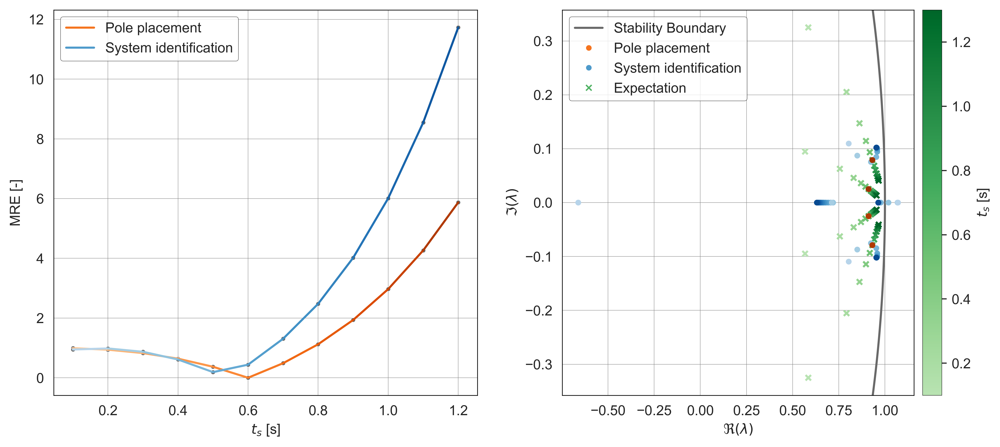

In [53]:
# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/NoExcitementPoles.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
poles_bessel = np.zeros((4, len(x)), dtype=complex)

for i in range(len(x)):
    # Desired poles
    tsdesired = x[i]
    pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
    poles_bessel[:, i] = np.exp(0.01 * pole)

for i in range(4):
    gradient_colors = get_color_gradient(colors2[2], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(poles_bessel[i]), np.imag(poles_bessel[i]), color=gradient_colors, marker="x", s=15)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('$t_s$ [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/NoExcitementPolesPlot.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Add a colorbar to the second plot
sm = plt.cm.ScalarMappable(cmap=LinearSegmentedColormap.from_list('custom_gradient', np.array(plt.get_cmap(colors2[2])(range(int(256*0.3),int(256*0.9))))), norm=Normalize(vmin=0.1, vmax=1.3))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax2, orientation='vertical', pad=0.02)
cbar.set_label('$t_s$ [s]')
# Customize the colorbar's outline properties
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.25)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper left')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper left')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/distNoExcitement.png", bbox_inches='tight')  
plt.show()

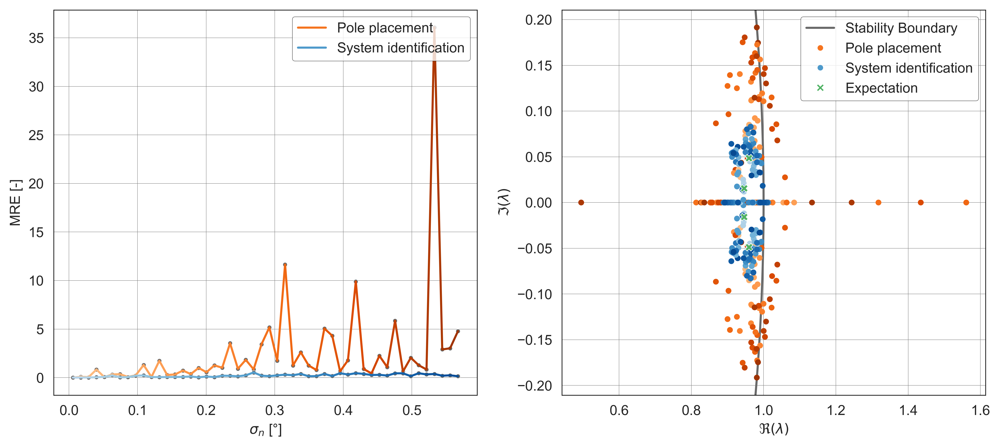

In [54]:
# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementNoise.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('$\sigma_n$ [°]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementNoisePlot.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/NoiseExcitement.png", bbox_inches='tight')  
plt.show()

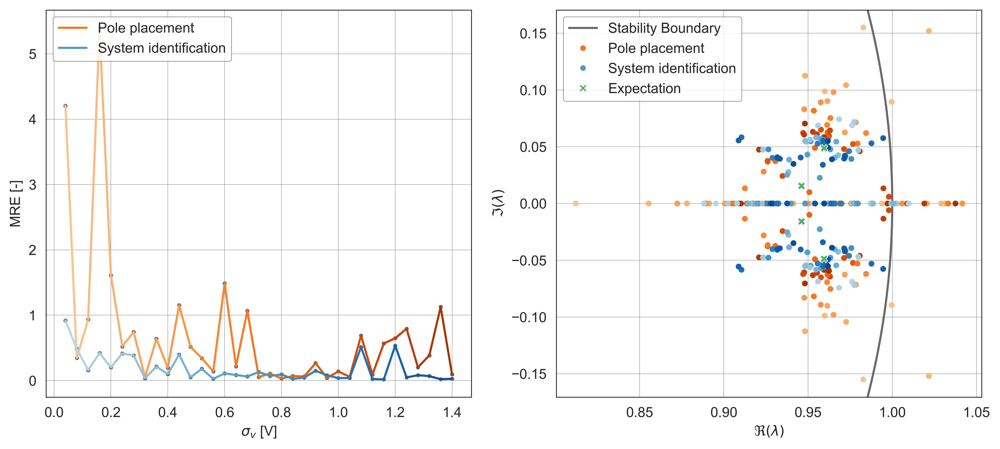

In [55]:
# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementPoles.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('$\sigma_v$ [V]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementPolesPlot.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper left')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper left')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExcitementAnalysis.png", bbox_inches='tight')  
plt.show()

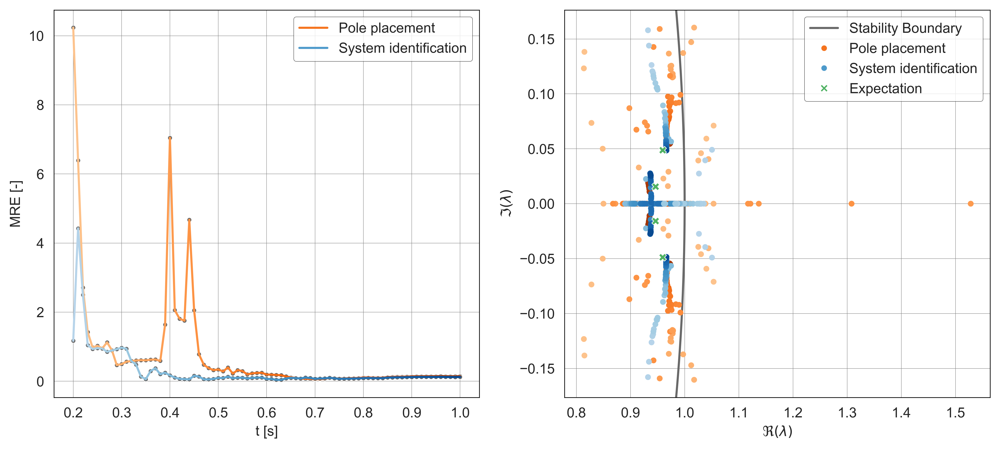

In [56]:
# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementVariable.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementVariablePlot.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/TimeExcitement.png", bbox_inches='tight')  
plt.show()

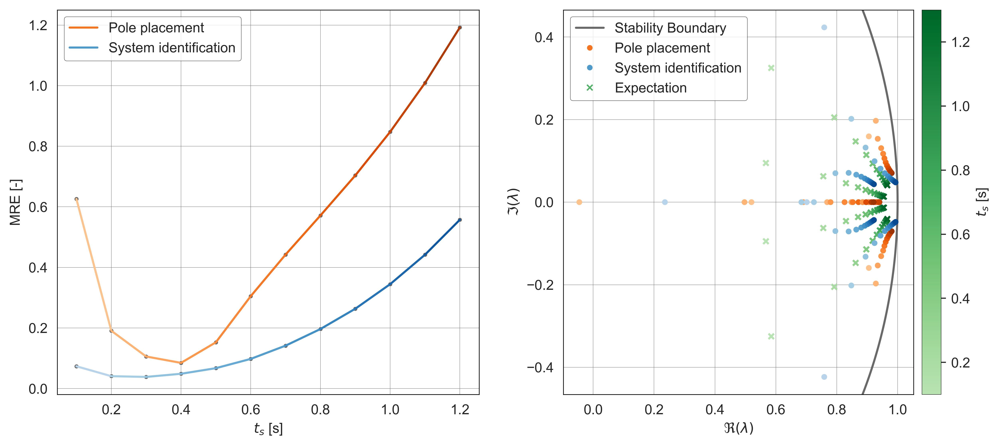

In [57]:
# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementPolesEvo.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)

# Initialize the poles_bessel array with the complex data type
poles_bessel = np.zeros((4, len(x)), dtype=complex)

for i in range(len(x)):
    # Desired poles
    tsdesired = x[i]
    pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
    poles_bessel[:, i] = np.exp(0.01 * pole)

for i in range(4):
    gradient_colors = get_color_gradient(colors2[2], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(poles_bessel[i]), np.imag(poles_bessel[i]), color=gradient_colors, marker="x", s=15)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('$t_s$ [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDSimulation/DataForPlot/WithExcitementPolesEvoPlot.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

# Add a colorbar to the second plot
sm = plt.cm.ScalarMappable(cmap=LinearSegmentedColormap.from_list('custom_gradient', np.array(plt.get_cmap(colors2[2])(range(int(256*0.3),int(256*0.9))))), norm=Normalize(vmin=0.1, vmax=1.3))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax2, orientation='vertical', pad=0.02)
cbar.set_label('$t_s$ [s]')
# Customize the colorbar's outline properties
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.25)

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper left')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper left')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExcitementPoleChange.png", bbox_inches='tight')  
plt.show()

## 3 Experimentation

## 3.2 DD Experimentation

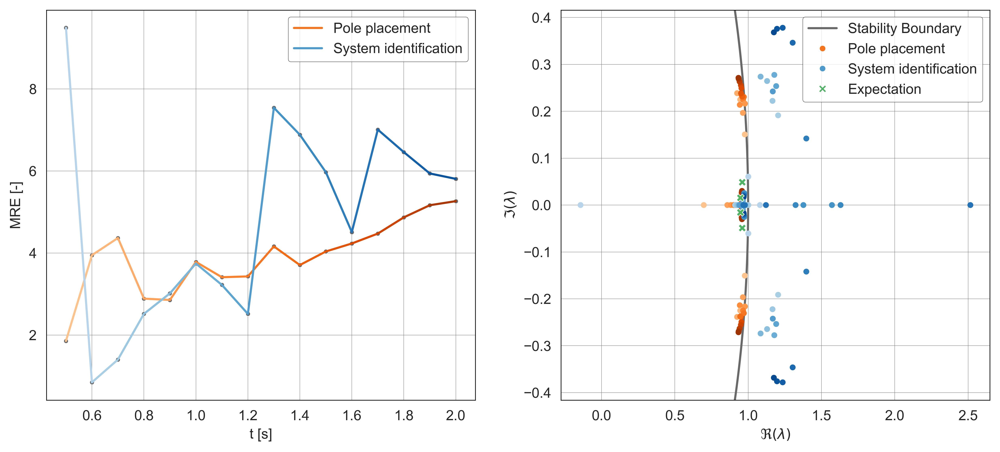

In [79]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable1Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable1Plotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExpeNoExcitement.png", bbox_inches='tight')  
plt.show()

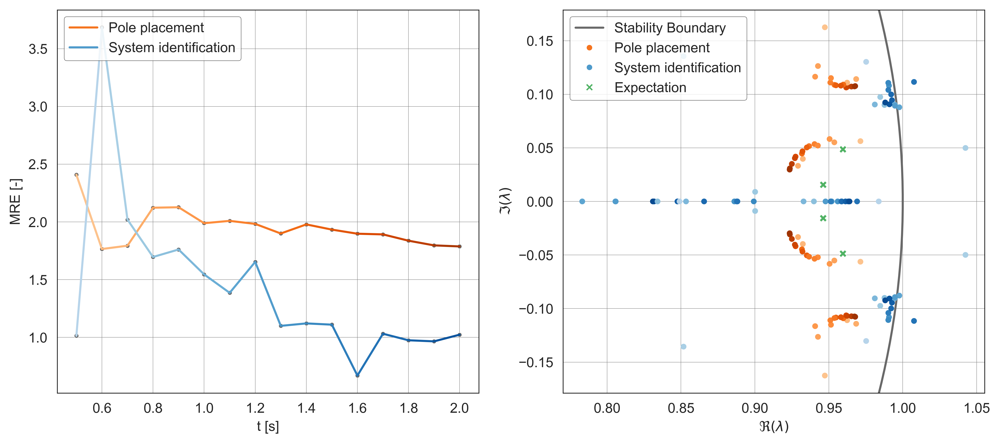

In [77]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable2Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable2Plotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper left')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper left')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExpeNoExcitementTest2.png", bbox_inches='tight')  
plt.show()

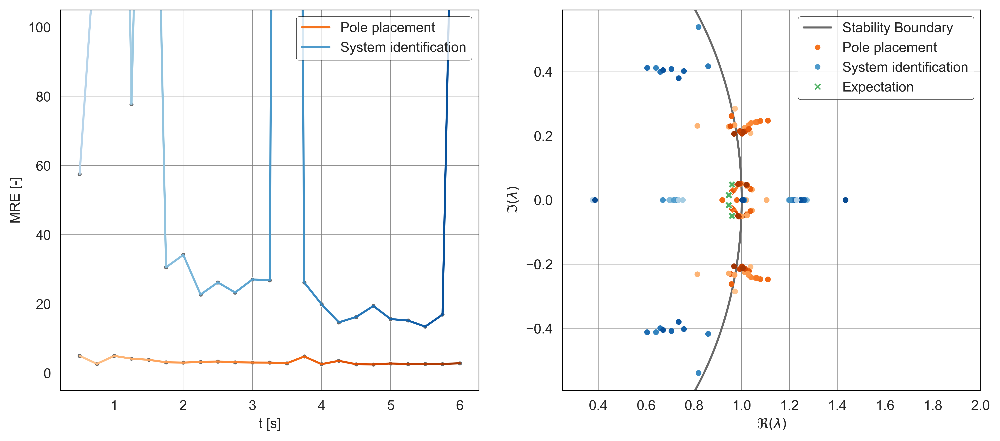

In [101]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable2bPlot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 1
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable2bPlotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax1.set_ylim(-5, 105)
ax2.set_ylim(ymin, ymax)
ax2.set_xlim(0.25, 2)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExpeNoExcitementTest3.png", bbox_inches='tight')  
plt.show()

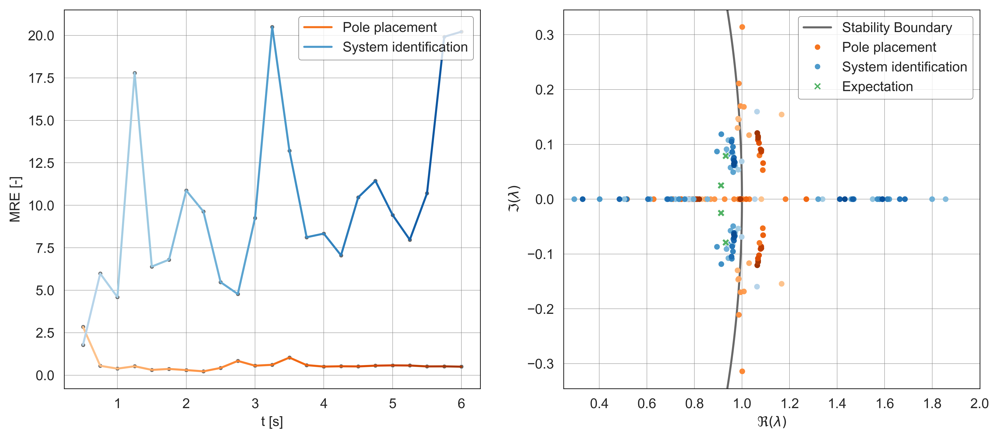

In [84]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable3Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 0.6
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable3Plotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
ax2.set_xlim(0.25, 2)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExpeWithExcitation.png", bbox_inches='tight')  
plt.show()

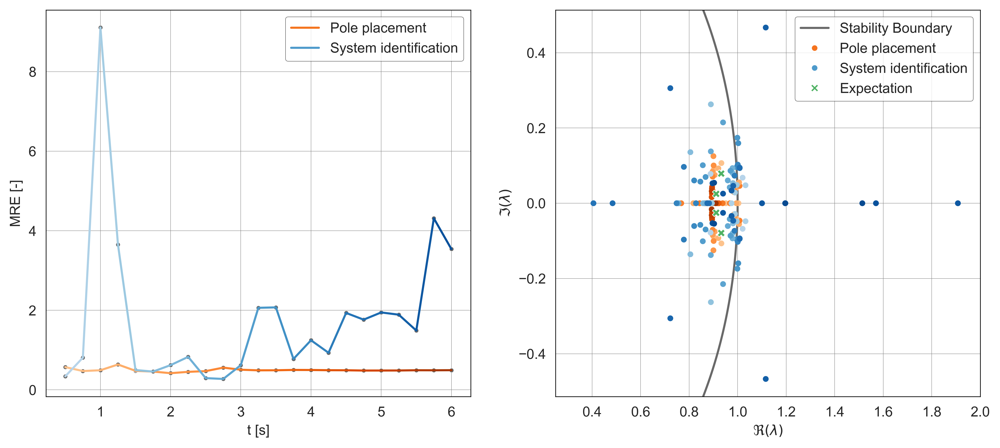

In [82]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable4Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
# Initialize the poles_bessel array with the complex data type
tsdesired = 0.6
pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
poles_bessel = np.exp(0.01 * pole)
sns.scatterplot(x=np.real(poles_bessel), y=np.imag(poles_bessel),ax=ax2, zorder=4, color=plt.get_cmap(colors2[2])(150), marker="X", s=30)

#sns.scatterplot(x=np.real(poles_bessel1), y=np.imag(poles_bessel1), ax=ax2,label='MB', color=gradient_colors, marker="X", s=20)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('t [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable4Plotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
ax2.set_xlim(0.25, 2)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/ExpeWithExcitationTest2.png", bbox_inches='tight')  
plt.show()

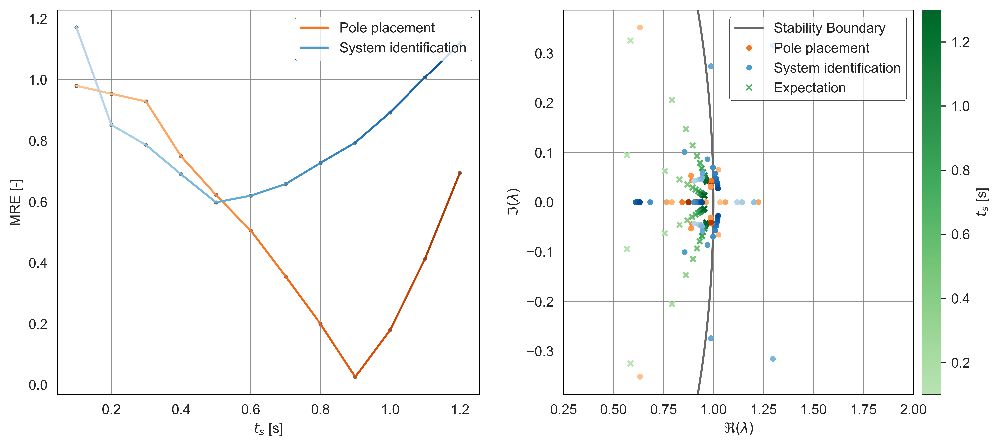

In [121]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable5Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=500)

# Initialize the poles_bessel array with the complex data type
poles_bessel = np.zeros((4, len(x)), dtype=complex)

for i in range(len(x)):
    # Desired poles
    tsdesired = x[i]
    pole = np.array([-4.016+5.072j, -4.016-5.072j, -5.528+1.655j, -5.528-1.655j]) / tsdesired
    poles_bessel[:, i] = np.exp(0.01 * pole)

for i in range(4):
    gradient_colors = get_color_gradient(colors2[2], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(poles_bessel[i]), np.imag(poles_bessel[i]), color=gradient_colors, marker="x", s=15)


gradient_colors = get_color_gradient(colors2[0], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y1[j:j+2], color=gradient_colors[j], linewidth=1.5)

#sns.lineplot(x=x1, y=y1, ax=ax1, label='PP', color=colors[0], linewidth=1.5)

sns.scatterplot(x=x, y=y1, ax=ax1, color='dimgray', marker="o", s=10)

gradient_colors = get_color_gradient(colors2[1], len(x))
for j in range(len(x)):
    ax1.plot(x[j:j+2], y2[j:j+2], color=gradient_colors[j], linewidth=1.5)

sns.scatterplot(x=x, y=y2, ax=ax1, color='dimgray', marker="o", s=10)

ax1.set_xlabel('$t_s$ [s]')
ax1.set_ylabel('MRE [-]')

# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable5Plotb.csv')
# Extract x and y values
x = data['x']
y1 = [data['p11'].apply(str_to_complex), data['p12'].apply(str_to_complex), data['p13'].apply(str_to_complex), data['p14'].apply(str_to_complex)]
y2 = [data['p21'].apply(str_to_complex), data['p22'].apply(str_to_complex), data['p23'].apply(str_to_complex), data['p24'].apply(str_to_complex)]

# Plotting y1 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[0], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y1[i][j:j+2]), np.imag(y1[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y1[i]), np.imag(y1[i]), zorder=2, color=gradient_colors, marker="o", s=10)

# Plotting y2 with color gradient
for i in range(4):
    gradient_colors = get_color_gradient(colors2[1], len(x))
    #for j in range(maxData - 1):
        #plt.plot(np.real(y2[i][j:j+2]), np.imag(y2[i][j:j+2]), color=gradient_colors[j], linewidth=0.75)
    ax2.scatter(np.real(y2[i]), np.imag(y2[i]), zorder=3, color=gradient_colors, marker="o", s=10)

# Plot 2
ax2.set_xlabel('$\Re(\lambda)$')
ax2.set_ylabel('$\Im(\lambda)$')

# Add a colorbar to the second plot
sm = plt.cm.ScalarMappable(cmap=LinearSegmentedColormap.from_list('custom_gradient', np.array(plt.get_cmap(colors2[2])(range(int(256*0.3),int(256*0.9))))), norm=Normalize(vmin=0.1, vmax=1.3))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax2, orientation='vertical', pad=0.02)
cbar.set_label('$t_s$ [s]')
# Customize the colorbar's outline properties
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.25)

legend_handles1 = [
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), linestyle='-', linewidth=1.5, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), linestyle='-', linewidth=1.5, label='System identification'),
]
legend_handles2 = [
    mlines.Line2D([], [], color='dimgray', linestyle='-', linewidth=1.5, label='Stability Boundary'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[0])(150), marker='.', linestyle='None', markersize=6, label='Pole placement'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[1])(150), marker='.', linestyle='None', markersize=6, label='System identification'),
    mlines.Line2D([], [], color=plt.get_cmap(colors2[2])(150), marker='x', linestyle='None', markersize=4, label='Expectation')
]

legend1 = ax1.legend(handles=legend_handles1, frameon=True, loc='upper right')
legend2 = ax2.legend(handles=legend_handles2, frameon=True, loc='upper right')

legend_frame = legend1.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

legend_frame = legend2.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)  # Change the box's border width

# Customizing plot borders and other settings for each subplot
for ax in (ax1,ax2):
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
# Get the current y-axis limits
ymin, ymax = ax2.get_ylim()
xmin, xmax = ax2.get_xlim()

# Generate points for the unit circle
theta = np.linspace(-np.pi, np.pi, 500)
unit_circle_x = np.cos(theta)
unit_circle_y = np.sin(theta)

# Mask points that are outside the current y-axis limits
mask = (unit_circle_x >= xmin) & (unit_circle_x <= xmax) & (unit_circle_y >= ymin-0.1) & (unit_circle_y <= ymax+0.1)
ax2.set_ylim(ymin, ymax)
ax2.set_xlim(0.25, 2)
# Plot the part of the unit circle within the current y-axis limits
ax2.plot(unit_circle_x[mask], unit_circle_y[mask], zorder=1, linestyle='-', color='dimgray', linewidth=1.5)

#plt.tight_layout()
plt.savefig("plot/FinalPlot.png", bbox_inches='tight')  
plt.show()

## Kalman Filter

In [ ]:
colnames=['time', 'phi', 'theta', 'phi_dot', 'theta_dot', 'ua', 'ref', 'ts'] 

file = 'rdmITAE1'
df = pd.read_csv("data/{}.txt".format(file), names=colnames, header=1)
#df = pd.read_csv("data/Bessel/0.7.txt", names=colnames, header=1)
start = 5
end   = 15
df.time -= df.time[0] + start*1000
df = df[df.time>=0]
df = df[df.time<end*1000]
df.time /=1000

# Reset the index
df.reset_index(drop=True, inplace=True)

x = np.vstack((df.phi, df.theta, df.phi_dot, df.theta_dot))

# Kalman filter initialization
n=4
Q = np.eye(n) * 0.001  # Process noise covariance
R = np.eye(n) * 0.0005  # Measurement noise covariance
P = np.eye(n)  # Initial estimate error covariance
x_hat = np.zeros((n, len(df.time)))  # Estimated states
x_hat[:, 0] = x[:, 0]

#Matrices modification:
a = 7.5
b = 0.19
c = 0.4
A_KF = A_dt.copy()
A_KF[:,2] = A_dt[:,2]+B_dt.T*(-b)

# Apply the filters
alpha = 0.5  # Smoothing factor for EMA, can be adjusted

cst = np.sign(df.ua)
df.ua = df.ua - cst*c

# Kalman filter implementation
for k in range(1, len(df.time)):
    # Prediction step
    x_hat[:, k] = A_KF @ x_hat[:, k-1] + B_dt.flatten() * df.ua[k-1]
    P = A_KF @ P @ A_KF.T + Q

    # Update step
    K = P @ C.T @ np.linalg.inv(C @ P @ C.T + R)
    x_hat[:, k] = x_hat[:, k] + K @ (x[:, k] - C @ x_hat[:, k])
    P = (np.eye(n) - K @ C) @ P

# Use the filtered signal
x_filtered = x_hat
# Create a new DataFrame with the filtered data
filtered_df = pd.DataFrame({
    'time': df.time,
    'phi': x_filtered[0, :],
    'theta': x_filtered[1, :],
    'phi_dot': x_filtered[2, :],
    'theta_dot': x_filtered[3, :],
    'ua': df.ua,
    'ref': df.ref,
    'ts': df.ts
})

# Save the filtered data to a CSV file
filtered_df.to_csv('data/KF_{}.csv'.format(file), index=False)


# Create a new figure with 4 subplots
fig, axs = plt.subplots(5, 1, figsize=(10, 8), sharex=True, dpi=500)

axs[0].plot(df.time, df.ua, label='$u_a = -Kx + v$', color=colors[0], linewidth=0.75)
axs[0].set_ylabel('$u_a$ [V]')
axs[0].legend()

# Plot phi
axs[1].plot(df.time, df.phi, label='$\\varphi$', color=colors[0], linewidth=0.75)
axs[1].plot(df.time, x_filtered[0, :], label='$\\varphi_{KF}$', color=colors[1], linewidth=0.75)
axs[1].set_ylabel('$\\varphi$ [rad]')
axs[1].legend()
# Set the y-axis formatter
axs[1].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot theta
axs[2].plot(df.time, df.theta*180/np.pi, label='$\\theta$', color=colors[0], linewidth=0.75)
axs[2].plot(df.time, x_filtered[1, :]*180/np.pi, label='$\\theta_{KF}$', color=colors[1], linewidth=0.75)
axs[2].set_ylabel('$\\theta$ [°]')
axs[2].legend()

# Plot phi_dot
axs[3].plot(df.time, df.phi_dot, label='$\\dot{\\varphi}$', color=colors[0], linewidth=0.75)
axs[3].plot(df.time, x_filtered[2, :], label='$\\dot{\\varphi}_{KF}$', color=colors[1], linewidth=0.75)
axs[3].set_ylabel('$\\dot{\\varphi}$ [rad/s]')
axs[3].legend()
axs[3].yaxis.set_major_formatter(FuncFormatter(multiple_of_pi))

# Plot theta_dot
axs[4].plot(df.time, df.theta_dot*180/np.pi, label='$\\dot{\\theta}$', color=colors[0], linewidth=0.75)
axs[4].plot(df.time, x_filtered[3, :]*180/np.pi, label='$\\dot{\\theta}_{KF}$', color=colors[1], linewidth=0.75)
axs[4].set_ylabel('$\\dot{\\theta}$ [°/s]')
axs[4].legend()

axs[4].set_xlabel('t [s]')


# Customizing plot borders and other settings for each subplot
for ax in axs:
    # Customizing axes and plot border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
        spine.set_color('black')
    # Setting the style for grid lines
    ax.grid(which='major', linestyle='-', linewidth='0.25', color='grey')
    ax.minorticks_on()  # Turn on minor ticks
    # Customize legend
    legend = ax.legend(frameon=True, loc='upper left')
    legend_frame = legend.get_frame()
    legend_frame.set_edgecolor('black')  # Change the box's border color
    legend_frame.set_linewidth(0.25)  # Change the box's border width

plt.tight_layout()
plt.savefig("plot/KalmanFilterStates.png", bbox_inches='tight')


In [ ]:
# Load data from CSV files
data = pd.read_csv('DDExperimental/DataForPlot/NoExcitementVariable5Plot.csv')

# Extract x and y values
x = data.x
y1 = data.y1
y2 = data.y2

# Plotting
plt.figure(figsize=(5, 4), dpi=500)
sns.set_style("whitegrid")

sns.lineplot(x=x, y=y1, label='Direct', color=colors[0], linewidth=0.75)
sns.scatterplot(x=x, y=y1, color='dimgray', marker="o", s=4)

sns.lineplot(x=x, y=y2, label='Indirect', color=colors[1], linewidth=0.75)
sns.scatterplot(x=x, y=y2, color='dimgray', marker="o", s=4)

# Customizing axes and plot border
ax = plt.gca()  # Get current axis
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
    spine.set_color('black')  # Set spines color to black

# Customize legend
legend = plt.legend(frameon=True)
legend_frame = legend.get_frame()
legend_frame.set_edgecolor('black')  # Change the box's border color
legend_frame.set_linewidth(0.25)      # Change the box's border width

# Setting the style for grid lines
plt.grid(which='major', linestyle='-', linewidth='0.25', color='grey')  # Major grid
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='grey')  # Minor grid
plt.minorticks_on()  # Turn on minor ticks

plt.xlabel('t [s]')
plt.ylabel('MRE [-]')

# Save and show plot
plt.savefig("plot/ExpeWithExcitationTest3.png", bbox_inches='tight')
plt.show()